# Librerías

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math

In [2]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
import keras_tuner as kt

# Importar Datos

In [3]:
# Cragar datos
df_demanda = pd.read_csv('./data/demanda_region.csv')

In [4]:
# Mercados de comercializacion en el dataframe
df_demanda['Values_code'].unique()

array(['ANTIOQUIA', 'ARAUCA', 'BAJO PUTUMAYO', 'BOGOTA - CUNDINAMARCA',
       'BOYACA', 'CALDAS', 'CALI - YUMBO - PUERTO TEJADA', 'CAQUETA',
       'CARIBE MAR', 'CARIBE SOL', 'CARTAGO', 'CASANARE', 'CAUCA',
       'CHOCO', 'GUAVIARE', 'HUILA', 'META', 'NARIÑO',
       'NORTE DE SANTANDER', 'PEREIRA', 'POPAYAN - PURACE', 'PUTUMAYO',
       'QUINDIO', 'RUITOQUE', 'SANTANDER', 'TOLIMA', 'TULUA',
       'VALLE DEL CAUCA', 'VALLE DEL SIBUNDOY', 'SIN CLASIFICAR'],
      dtype=object)

# Funciones para pre procesamiento de los datos

In [5]:
from datetime import datetime, timedelta
import requests
# Función para obtener los días festivos desde Nager.Date API
def obtener_festivos(colombia, anio):
    url = f"https://date.nager.at/api/v3/publicholidays/{anio}/{colombia}"
    
    response = requests.get(url)
    if response.status_code == 200:
        festivos = response.json()
        # Extraer solo las fechas de los festivos
        return [festivo['date'] for festivo in festivos]
    else:
        print(f"Error al obtener festivos para el año {anio}, código de estado {response.status_code}")
        return []

# Crear un rango de fechas desde 2021 hasta septiembre de 2024
fecha_inicio = datetime(2021, 1, 1)
fecha_fin = datetime(2024, 9, 30)

# Crear una lista con todas las fechas en ese rango
fechas = pd.date_range(start=fecha_inicio, end=fecha_fin)

# Obtener los días festivos para cada año de 2021 a 2024
festivos_colombia = []
for anio in range(2021, 2025):
    festivos_colombia.extend(obtener_festivos('CO', anio))

# Convertir las fechas de festivos a formato datetime
festivos_colombia = [datetime.strptime(festivo, "%Y-%m-%d").date() for festivo in festivos_colombia]

# Función para clasificar los días
def clasificar_dia(fecha):
    if fecha in festivos_colombia:
        return 1
    else:
        return 0

# Crear un DataFrame con las fechas y la clasificación
datos = pd.DataFrame({'Date': fechas})
datos['Festivo'] = datos['Date'].apply(lambda x: clasificar_dia(x.date()))

# Guardar la lista en un archivo CSV
datos.to_csv("./data/festivos.csv", index=False)

In [6]:
def crear_matriz_modelo(df, ventana_entrada=60, ventana_salida=30):
    # Crear una lista para almacenar cada fila de la matriz final
    matriz_final = []
    
    ventana_total = ventana_entrada + ventana_salida
    # Iteramos sobre el DataFrame para extraer ventanas de 60 días
    for i in range(len(df) - ventana_total - 1):
        # Extraemos una ventana de 60 días
        ventana = df.iloc[i:i+ventana_total]
        
        # Reorganizamos la ventana en una sola fila con sufijos para cada día
        fila = {}
        for j in range(ventana_entrada):
            fila[f'fe-{j+1}'] = ventana.iloc[j]['Festivo']
            fila[f'd-{j+1}'] = ventana.iloc[j]['Dia']
            fila[f't-{j+1}'] = ventana.iloc[j]['Total']
        for t in range(ventana_entrada, ventana_total):
            fila[f'fe-{t+1}'] = ventana.iloc[t]['Festivo']
            fila[f'd-{t+1}'] = ventana.iloc[t]['Dia']
            fila[f'r-{t+1-ventana_entrada}'] = ventana.iloc[t]['Total']
        
        # Añadimos la fila al conjunto de la matriz final
        matriz_final.append(fila)
    
    # Convertimos la lista de filas en un DataFrame final
    matriz_dias_df = pd.DataFrame(matriz_final)
    
    return matriz_dias_df

In [7]:
def df_ciudad(df, df_festivos, ciudad, fecha):
    df_final = df[df['Values_code'] == ciudad]
    df_final = df_final.drop(columns=['Id', 'Values_code', 'Values_MarketType'])
    df_final['Date'] = pd.to_datetime(df_final['Date'])
    horas = [f'Values_Hour{i:02d}' for i in range(1, 25)]
    df_final['Total'] = df_final[horas].sum(axis=1)
    df_final = df_final.drop(columns=horas)
    df_final = df_final.groupby('Date').sum()
    df_final = df_final.reset_index()
    df_final = df_final.sort_values('Date')
    df_final = df_final.reset_index(drop=True)
    df_final = df_final[df_final['Date'] <= fecha]
    df_final = pd.merge(df_final, df_festivos, on='Date', how='left')
    df_final['Dia'] = df_final['Date'].apply(lambda x: x.weekday())
    return df_final

In [8]:
def plot_by_interval(real_values, predicted_values, title, color_real, color_pred, max_plots=10):
    days_interval = 30
    num_plots = min(len(real_values) // days_interval + 1, max_plots)

    fig, axes = plt.subplots(num_plots, 1, figsize=(14, 6 * num_plots))

    if num_plots == 1:
        axes = [axes]

    real_values = real_values.values

    for i in range(num_plots):
        x_values = list(range(1, days_interval + 1))
        x_values_strings = [str(x) for x in x_values]
        axes[i].plot(x_values_strings, real_values[i], color=color_real, label='Real')
        axes[i].plot(x_values_strings, predicted_values[i], color=color_pred, label='Predicción')

        # Configuración de cada subgráfico
        axes[i].set_title(f'{title} - Intervalo {i + 1}')
        axes[i].set_xlabel('Días')
        axes[i].set_ylabel('Valores')
        axes[i].legend()

    # Ajustar la disposición de los subgráficos
    plt.show()

# Pre procesamiento de los datos

In [9]:
# Leer csv de festivos
df_festivos = pd.read_csv('./data/festivos.csv')
df_festivos['Date'] = pd.to_datetime(df_festivos['Date'])

In [10]:
df_demanda.fillna(0, inplace=True)
horas = [f'Values_Hour{i:02d}' for i in range(1, 25)]
df_demanda['Total'] = df_demanda[horas].sum(axis=1)
grouped_data = df_demanda.groupby('Values_code')['Total'].sum().reset_index()
top_5_ciudades = grouped_data.sort_values(by='Total', ascending=False).head(10)['Values_code'].tolist()

In [11]:
fecha = '2024-09-30'
df_demanda_bogota = df_ciudad(df_demanda, df_festivos, top_5_ciudades[0], fecha)
df_demanda_caribe_mar = df_ciudad(df_demanda, df_festivos, top_5_ciudades[1], fecha)
df_demanda_antioquia = df_ciudad(df_demanda, df_festivos, top_5_ciudades[2], fecha)
df_demanda_caribe_sol = df_ciudad(df_demanda, df_festivos, top_5_ciudades[3], fecha)
df_demanda_cali = df_ciudad(df_demanda, df_festivos, top_5_ciudades[4], fecha)
df_demanda_santander = df_ciudad(df_demanda, df_festivos, top_5_ciudades[5], fecha)
df_demanda_boyaca = df_ciudad(df_demanda, df_festivos, top_5_ciudades[6], fecha)
df_demanda_vcauca = df_ciudad(df_demanda, df_festivos, top_5_ciudades[7], fecha)
df_demanda_meta = df_ciudad(df_demanda, df_festivos, top_5_ciudades[8], fecha)
df_demanda_nsantander = df_ciudad(df_demanda, df_festivos, top_5_ciudades[9], fecha)

In [12]:
matriz_modelo_bogota = crear_matriz_modelo(df_demanda_bogota, 60, 30)
matriz_modelo_cm = crear_matriz_modelo(df_demanda_caribe_mar, 60, 30)
matriz_modelo_antioquia = crear_matriz_modelo(df_demanda_antioquia, 60, 30)
matriz_modelo_cs = crear_matriz_modelo(df_demanda_caribe_sol, 60, 30)
matriz_modelo_cali = crear_matriz_modelo(df_demanda_cali, 60, 30)
matriz_modelo_santander = crear_matriz_modelo(df_demanda_santander, 60, 30)
matriz_modelo_boyaca = crear_matriz_modelo(df_demanda_boyaca, 60, 30)
matriz_modelo_vcauca = crear_matriz_modelo(df_demanda_vcauca, 60, 30)
matriz_modelo_meta = crear_matriz_modelo(df_demanda_meta, 60, 30)
matriz_modelo_nsantander = crear_matriz_modelo(df_demanda_nsantander, 60, 30)

# Entrenamiento de modelos de las 10 ciudades con más consumo

In [13]:
# Definir la función para construir el modelo MLP
def build_model_mlp(hp):
    model = Sequential(name="MLP")
    
    # Hiperparámetros para las capas ocultas
    model.add(Dense(units=hp.Int('units_1', min_value=32, max_value=512, step=32), input_dim=240, activation='relu'))
    model.add(Dense(units=hp.Int('units_2', min_value=32, max_value=512, step=32), activation='relu'))
    model.add(Dense(units=hp.Int('units_3', min_value=32, max_value=512, step=32), activation='relu'))
    
    # Capa de salida
    model.add(Dense(30, activation='linear'))

    # Optimización del learning rate
    model.compile(loss='mae', 
                  optimizer=Adam(learning_rate=hp.Float('learning_rate', min_value=1e-5, max_value=1e-2, sampling='LOG', default=0.001)))
    
    return model

In [14]:
# Definir la función para construir el modelo
def build_model_CNN(hp):
    model = Sequential(name="CNN")

    # Primera capa convolucional con hiperparámetros para filtros y tamaño de kernel
    model.add(Conv1D(filters=hp.Int('filters_1', min_value=32, max_value=128, step=32), 
                     kernel_size=hp.Int('kernel_size_1', min_value=3, max_value=7, step=2), 
                     activation='relu', input_shape=(240, 1)))
    model.add(MaxPooling1D(pool_size=2))  # Reducción de dimensionalidad

    # Segunda capa convolucional con filtros y tamaño de kernel optimizados
    model.add(Conv1D(filters=hp.Int('filters_2', min_value=64, max_value=256, step=64), 
                     kernel_size=hp.Int('kernel_size_2', min_value=3, max_value=7, step=2), 
                     activation='relu'))
    model.add(MaxPooling1D(pool_size=2))

    # Aplanar y agregar capas densas
    model.add(Flatten())
    model.add(Dense(units=hp.Int('units_dense', min_value=64, max_value=256, step=64), activation='relu'))
    model.add(Dense(30, activation='linear'))  # Salida para regresión

    # Optimización de la tasa de aprendizaje
    model.compile(loss='mae', 
                  optimizer=Adam(learning_rate=hp.Float('learning_rate', min_value=1e-5, max_value=1e-2, sampling='LOG', default=0.001)))

    return model

## Ciudad 1

Modelo MLP

In [15]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_bogota.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_bogota[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_bogota = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_bogota.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\MLP_tuning\tuner0.json



c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1934067.2500
Test Loss: 1990981.125


In [16]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_bogota = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_bogota)

{'units_1': 448, 'units_2': 384, 'units_3': 320, 'learning_rate': 0.001452008626146579, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 1, 'tuner/round': 1, 'tuner/trial_id': '0053'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


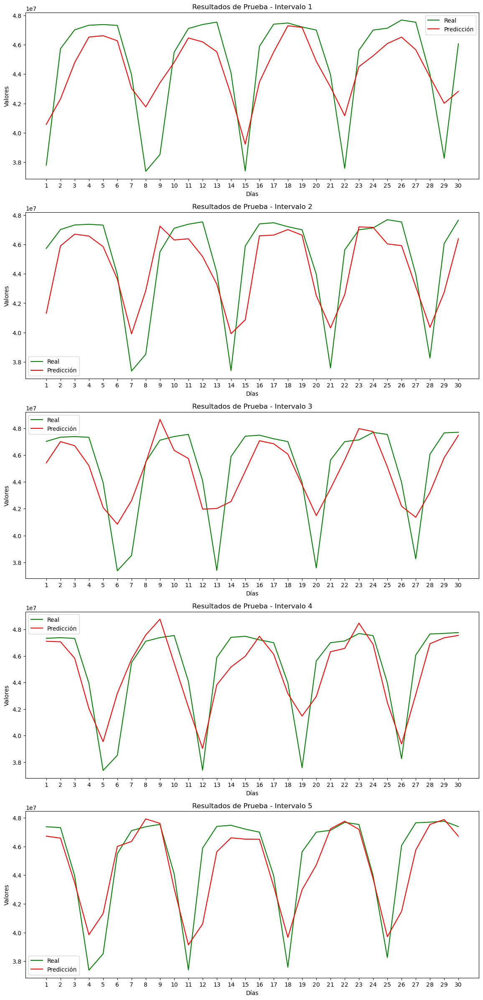

In [17]:
trainPredict = best_model_MLP_bogota.predict(X_train)
testPredict = best_model_MLP_bogota.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [18]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_bogota = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_bogota.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\CNN_tuning\tuner0.json


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1726030.7500
Test Loss: 1811306.5


In [19]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_bogota = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_bogota)

{'filters_1': 96, 'kernel_size_1': 5, 'filters_2': 256, 'kernel_size_2': 5, 'units_dense': 256, 'learning_rate': 0.0002973226244782793, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0012'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


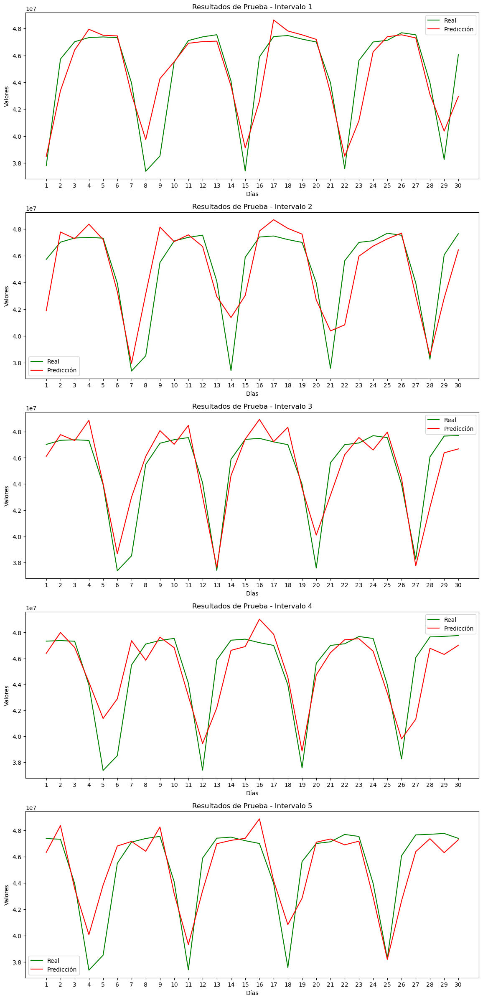

In [20]:
trainPredict = best_model_CNN_bogota.predict(X_train)
testPredict = best_model_CNN_bogota.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 2

MLP

In [21]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_2')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_cm.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cm[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_cm = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_cm.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\MLP_tuning_2\tuner0.json
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1530608.2500
Test Loss: 1452093.0


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [22]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_cm = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_cm)

{'units_1': 448, 'units_2': 32, 'units_3': 448, 'learning_rate': 0.0005488161779404732, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step


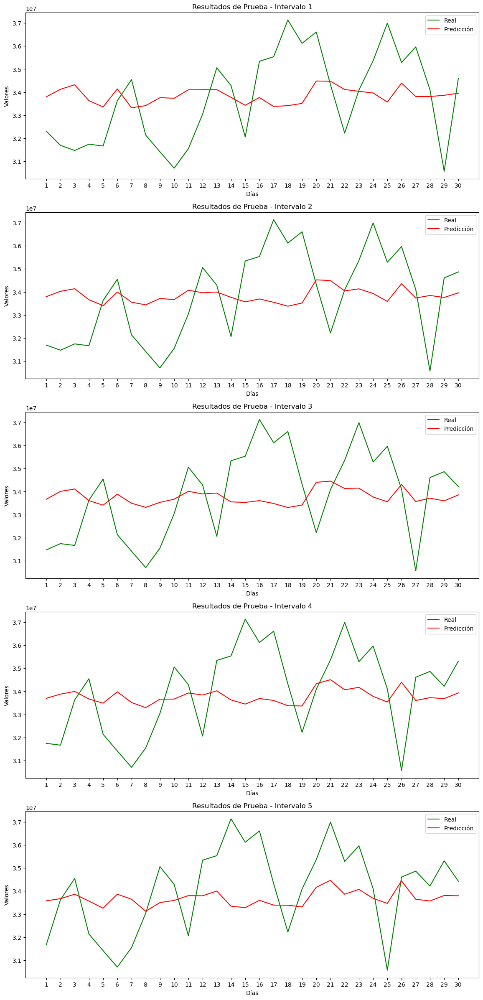

In [23]:
trainPredict = best_model_MLP_cm.predict(X_train)
testPredict = best_model_MLP_cm.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [24]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_2')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_cm = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_cm.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\CNN_tuning_2\tuner0.json
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1587154.875000

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1525182.6250
Test Loss: 1454228.875


In [25]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_cm = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_cm)

{'filters_1': 32, 'kernel_size_1': 5, 'filters_2': 64, 'kernel_size_2': 5, 'units_dense': 128, 'learning_rate': 0.0006527711140461339, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


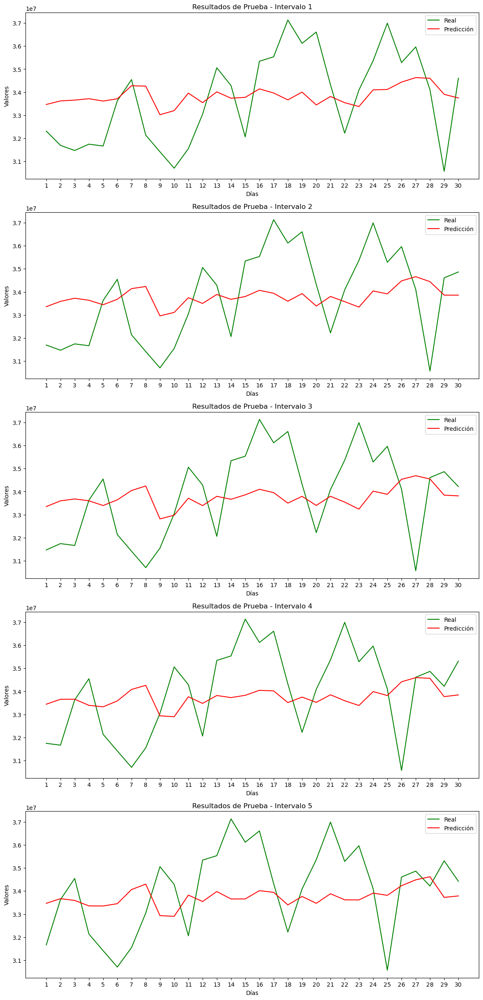

In [26]:
trainPredict = best_model_CNN_cm.predict(X_train)
testPredict = best_model_CNN_cm.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 3

MLP

In [27]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_3_1')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_antioquia.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_antioquia[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_antioquia = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_antioquia.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\MLP_tuning_3_1\tuner0.json
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1478860.1250
Test Loss: 1535519.875


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [28]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_antioquia = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_antioquia)

{'units_1': 384, 'units_2': 448, 'units_3': 416, 'learning_rate': 0.0014448315026478068, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


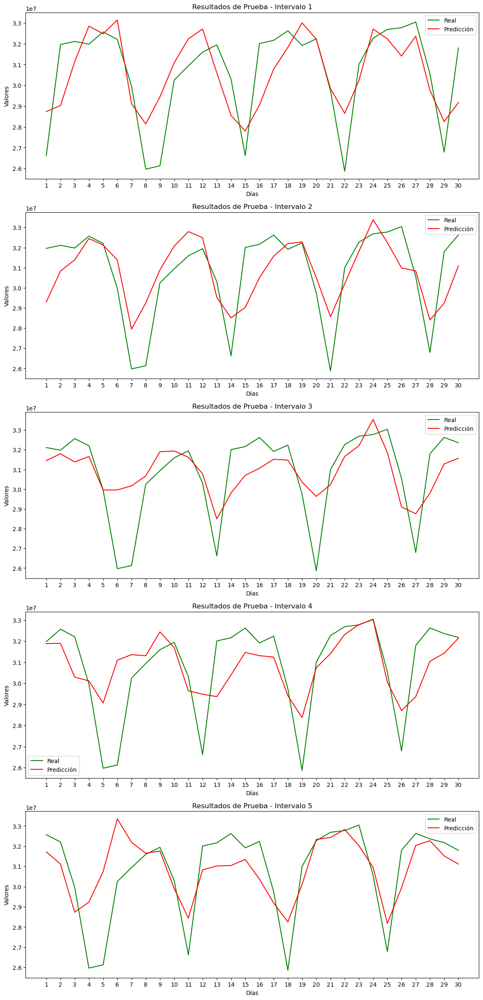

In [29]:
trainPredict = best_model_MLP_antioquia.predict(X_train)
testPredict = best_model_MLP_antioquia.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [30]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_3_1')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_antioquia = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_antioquia.evaluate(X_test, Y_test)

Reloading Tuner from my_dir\CNN_tuning_3_1\tuner0.json


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1159327.1250


In [31]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_antioquia = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_antioquia)

{'filters_1': 32, 'kernel_size_1': 7, 'filters_2': 192, 'kernel_size_2': 5, 'units_dense': 256, 'learning_rate': 0.0013297826728464373, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


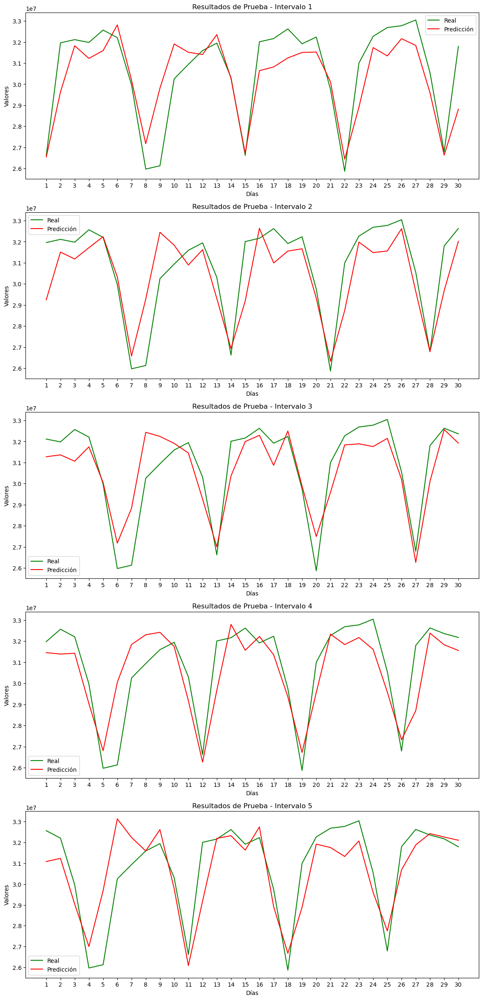

In [32]:
trainPredict = best_model_CNN_antioquia.predict(X_train)
testPredict = best_model_CNN_antioquia.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 4

MLP

In [33]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_4_1')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_cs.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cs[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_cs = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_cs.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\MLP_tuning_4_1\tuner0.json
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1748222.6250
Test Loss: 1571500.875


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [34]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_cs = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_cs)

{'units_1': 224, 'units_2': 256, 'units_3': 256, 'learning_rate': 0.0010200115948226143, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0045'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step


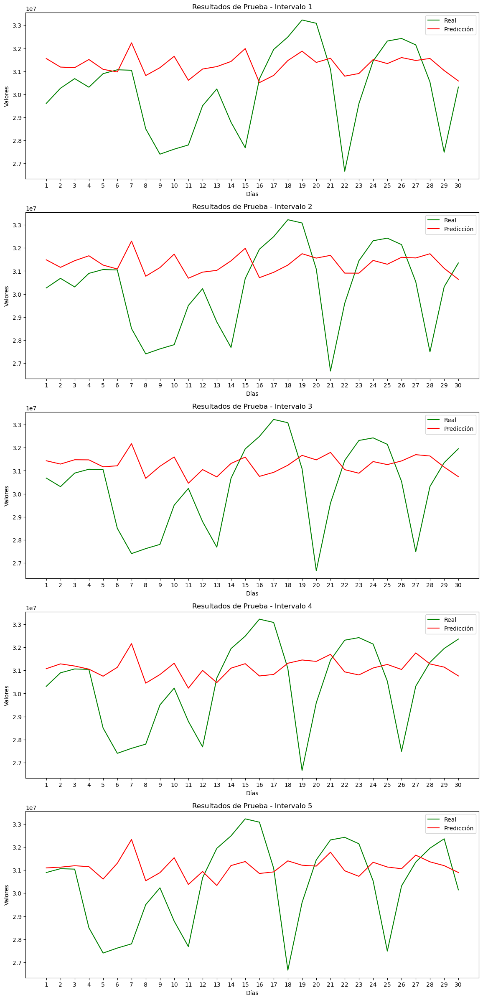

In [35]:
trainPredict = best_model_MLP_cs.predict(X_train)
testPredict = best_model_MLP_cs.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [36]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_4_1')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_cs = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_cs.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\CNN_tuning_4_1\tuner0.json
 2/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1808547.87500

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1889100.1250
Test Loss: 1703196.375


In [37]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_cs = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_cs)

{'filters_1': 32, 'kernel_size_1': 5, 'filters_2': 192, 'kernel_size_2': 5, 'units_dense': 128, 'learning_rate': 0.0014653087798770436, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


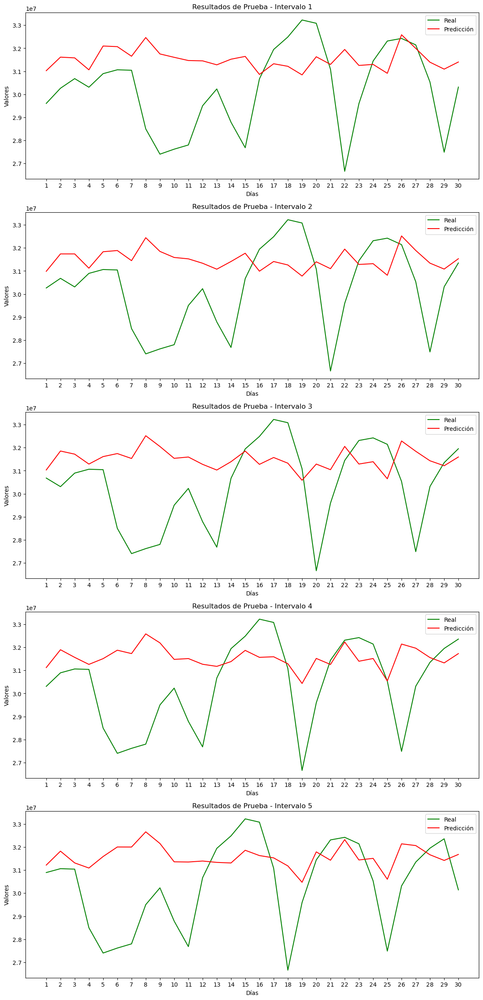

In [38]:
trainPredict = best_model_CNN_cs.predict(X_train)
testPredict = best_model_CNN_cs.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciduad 5

MLP

In [39]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_5_1')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_cali.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cali[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_cali = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_cali.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\MLP_tuning_5_1\tuner0.json
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 770619.9375  
Test Loss: 803116.6875


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [40]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_cali = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_cali)

{'units_1': 160, 'units_2': 384, 'units_3': 320, 'learning_rate': 0.000769123770094692, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0012'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step


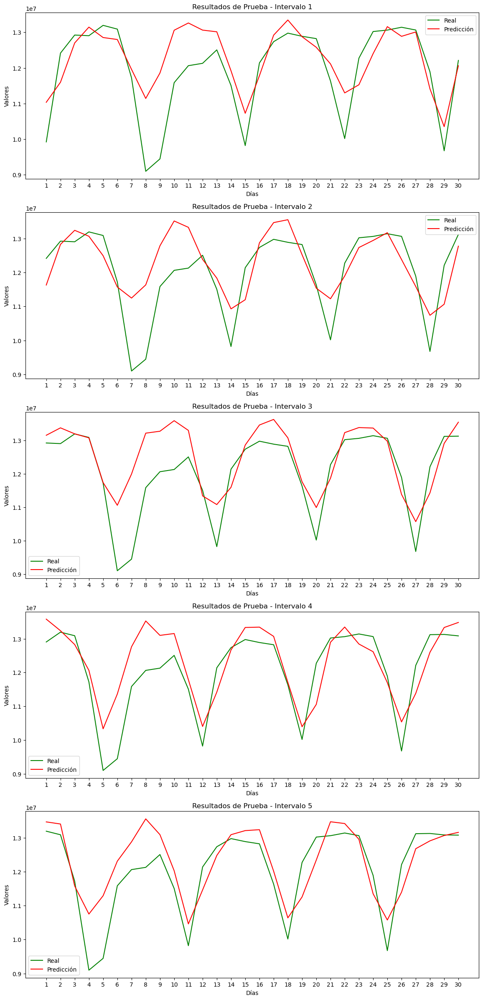

In [41]:
trainPredict = best_model_MLP_cali.predict(X_train)
testPredict = best_model_MLP_cali.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [42]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_5_1')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_cali = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_cali.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Reloading Tuner from my_dir\CNN_tuning_5_1\tuner0.json


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 710068.9375
Test Loss: 742551.25


In [43]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_cali = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_cali)

{'filters_1': 128, 'kernel_size_1': 5, 'filters_2': 192, 'kernel_size_2': 7, 'units_dense': 192, 'learning_rate': 0.0007059057236196819, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0012'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


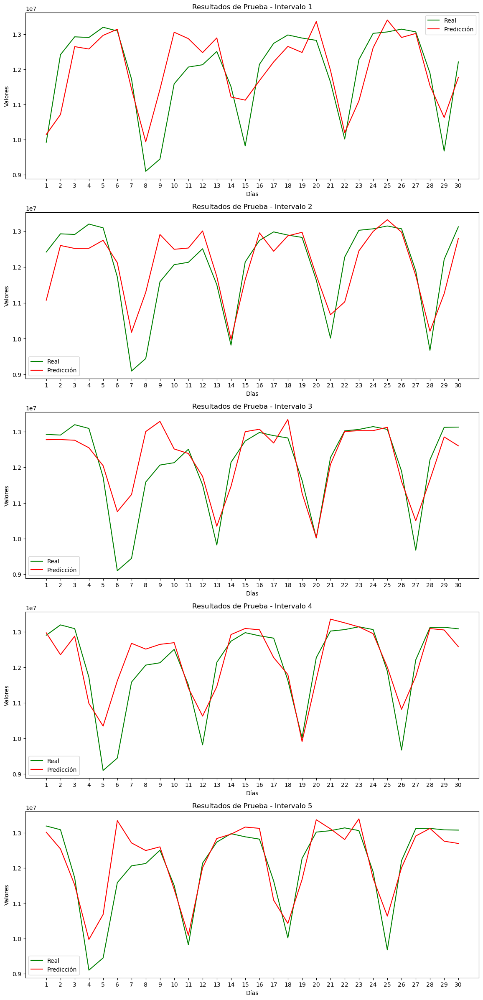

In [44]:
trainPredict = best_model_CNN_cali.predict(X_train)
testPredict = best_model_CNN_cali.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 6

MLP

In [45]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_6')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_santander.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_santander[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_santander = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_santander.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 03s]
val_loss: 527717.25

Best val_loss So Far: 505142.5625
Total elapsed time: 00h 02m 20s
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 490700.2188


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Test Loss: 514418.34375


In [46]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_santander = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_santander)

{'units_1': 192, 'units_2': 352, 'units_3': 352, 'learning_rate': 0.0006723411855950719, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


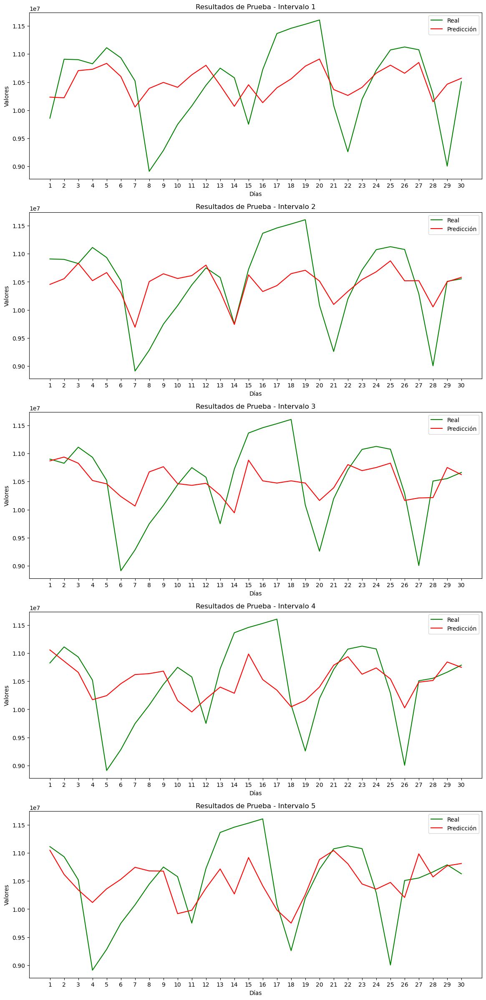

In [47]:
trainPredict = best_model_MLP_santander.predict(X_train)
testPredict = best_model_MLP_santander.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [48]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_6')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_santander = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_santander.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 24s]
val_loss: 2266680.25

Best val_loss So Far: 468860.8125
Total elapsed time: 00h 12m 24s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 442403.9062
Test Loss: 462616.03125


In [49]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_santander = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_santander)

{'filters_1': 96, 'kernel_size_1': 5, 'filters_2': 192, 'kernel_size_2': 3, 'units_dense': 192, 'learning_rate': 0.0008658095646581133, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0014'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


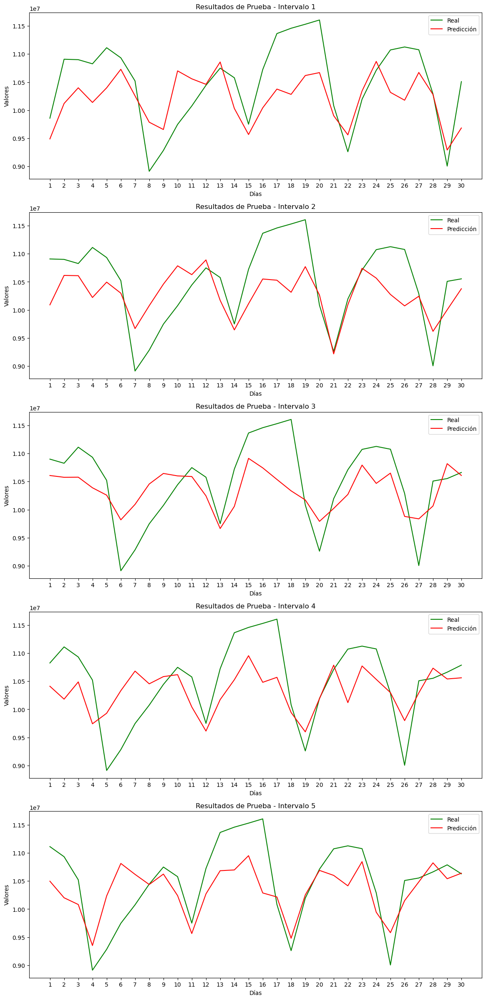

In [50]:
trainPredict = best_model_CNN_santander.predict(X_train)
testPredict = best_model_CNN_santander.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 7

CLP

In [51]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_7')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_boyaca.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_boyaca[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_boyaca = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_boyaca.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 16s]
val_loss: 6822716.0

Best val_loss So Far: 446797.1875
Total elapsed time: 00h 11m 27s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 455777.0625
Test Loss: 458186.75


In [52]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_boyaca = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_boyaca)

{'units_1': 32, 'units_2': 480, 'units_3': 512, 'learning_rate': 0.00030996345859268527, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0044'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


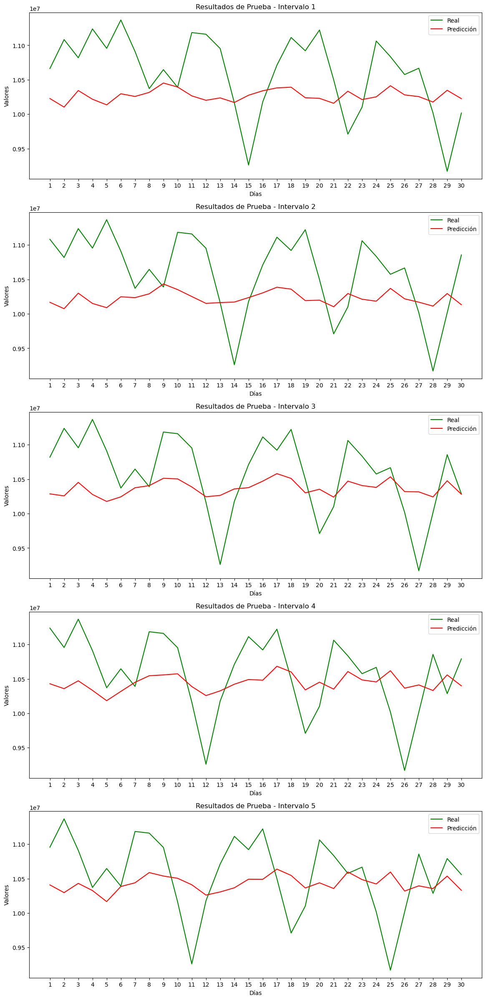

In [53]:
trainPredict = best_model_MLP_boyaca.predict(X_train)
testPredict = best_model_MLP_boyaca.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [54]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_7')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_boyaca = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_boyaca.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 24s]
val_loss: 448516.4375

Best val_loss So Far: 443991.71875
Total elapsed time: 00h 16m 38s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 452109.9062
Test Loss: 453444.40625


In [55]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_boyaca = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_boyaca)

{'filters_1': 96, 'kernel_size_1': 7, 'filters_2': 256, 'kernel_size_2': 7, 'units_dense': 256, 'learning_rate': 4.1034845396867217e-05, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 1, 'tuner/round': 1, 'tuner/trial_id': '0020'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


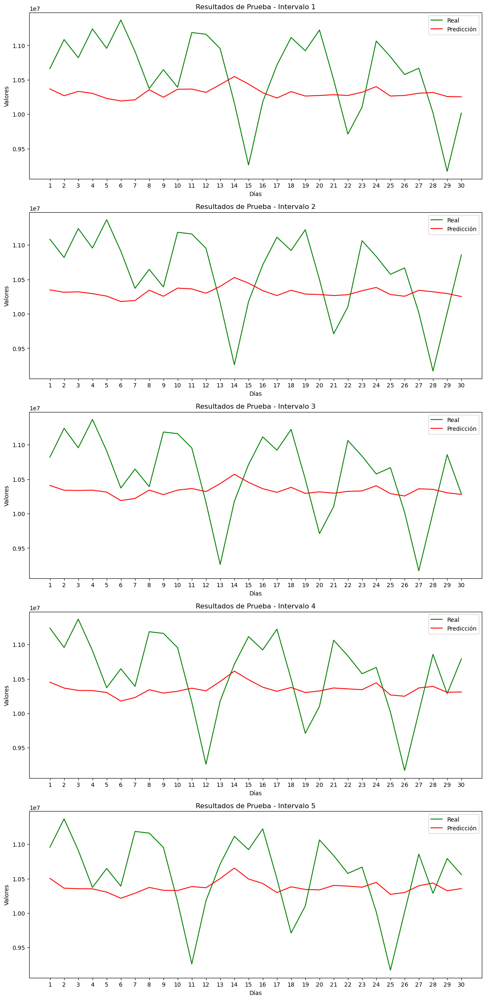

In [56]:
trainPredict = best_model_CNN_boyaca.predict(X_train)
testPredict = best_model_CNN_boyaca.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 8

MLP

In [57]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_8')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_vcauca.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_vcauca[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_vcauca = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_vcauca.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 18s]
val_loss: 2309035.0

Best val_loss So Far: 401555.1875
Total elapsed time: 00h 13m 52s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 451359.1875
Test Loss: 459672.125


In [58]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_vcauca = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_vcauca)

{'units_1': 128, 'units_2': 416, 'units_3': 352, 'learning_rate': 0.0007766397281390511, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0012'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


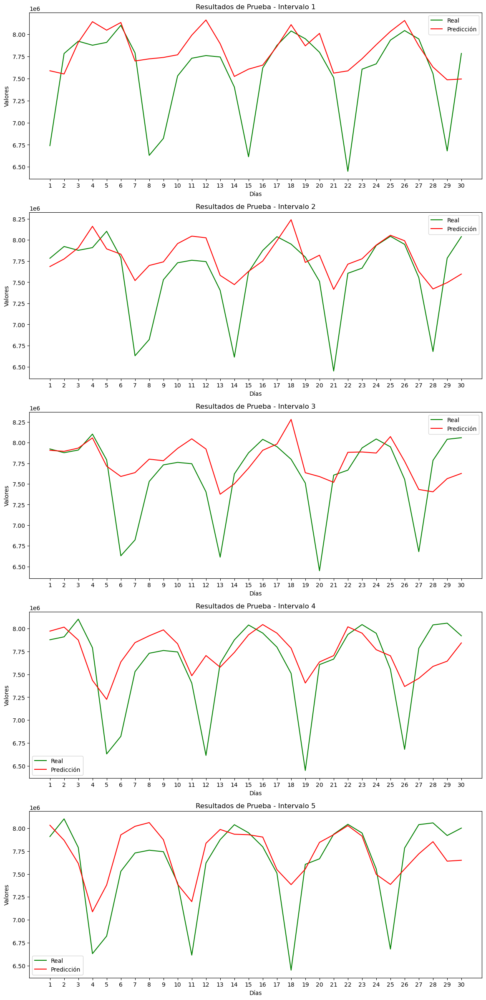

In [59]:
trainPredict = best_model_MLP_vcauca.predict(X_train)
testPredict = best_model_MLP_vcauca.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [60]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_8')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_vcauca = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_vcauca.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 29s]
val_loss: 1072994.625

Best val_loss So Far: 356845.9375
Total elapsed time: 00h 19m 04s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 419952.6250
Test Loss: 427895.5


In [61]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_vcauca = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_vcauca)

{'filters_1': 32, 'kernel_size_1': 7, 'filters_2': 192, 'kernel_size_2': 5, 'units_dense': 256, 'learning_rate': 0.0003142598058713565, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


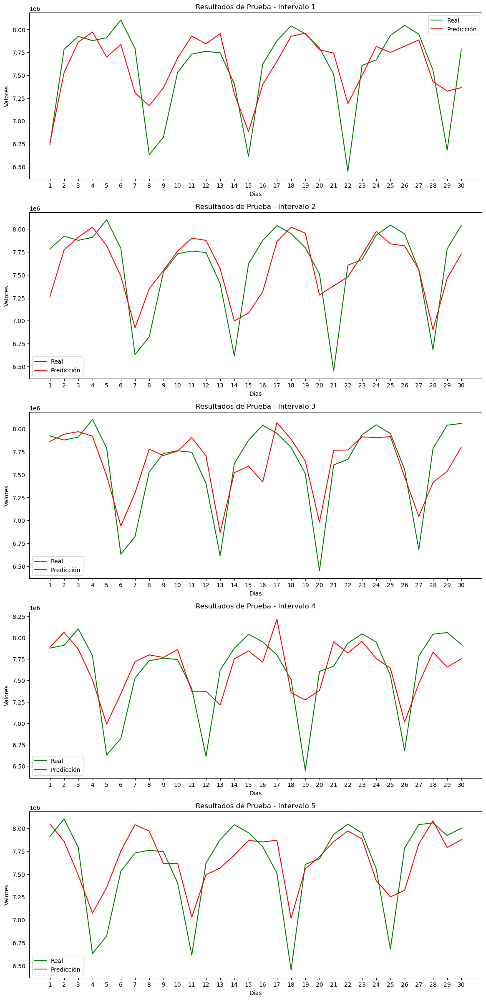

In [62]:
trainPredict = best_model_CNN_vcauca.predict(X_train)
testPredict = best_model_CNN_vcauca.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 9

MLP

In [63]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_9')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_meta.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_meta[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_meta = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_meta.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 21s]
val_loss: 358998.34375

Best val_loss So Far: 358998.34375
Total elapsed time: 00h 16m 35s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 374526.9688
Test Loss: 413960.53125


In [64]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_meta = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_meta)

{'units_1': 256, 'units_2': 320, 'units_3': 64, 'learning_rate': 0.001839872976490388, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


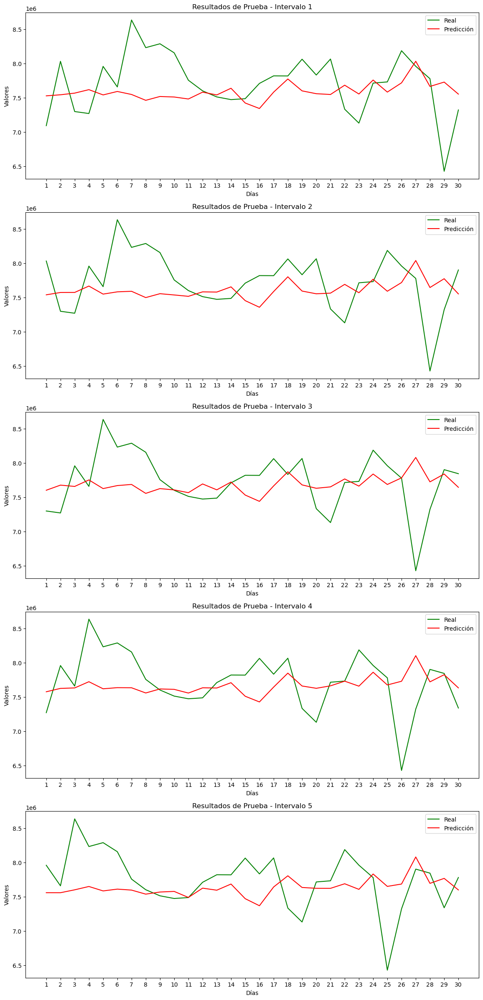

In [65]:
trainPredict = best_model_MLP_meta.predict(X_train)
testPredict = best_model_MLP_meta.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [66]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_9')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_meta = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_meta.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 32s]
val_loss: 374877.6875

Best val_loss So Far: 362949.34375
Total elapsed time: 00h 21m 37s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 365445.4375
Test Loss: 406033.375


In [67]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_meta = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_meta)

{'filters_1': 32, 'kernel_size_1': 7, 'filters_2': 64, 'kernel_size_2': 3, 'units_dense': 128, 'learning_rate': 0.004396298187920737, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


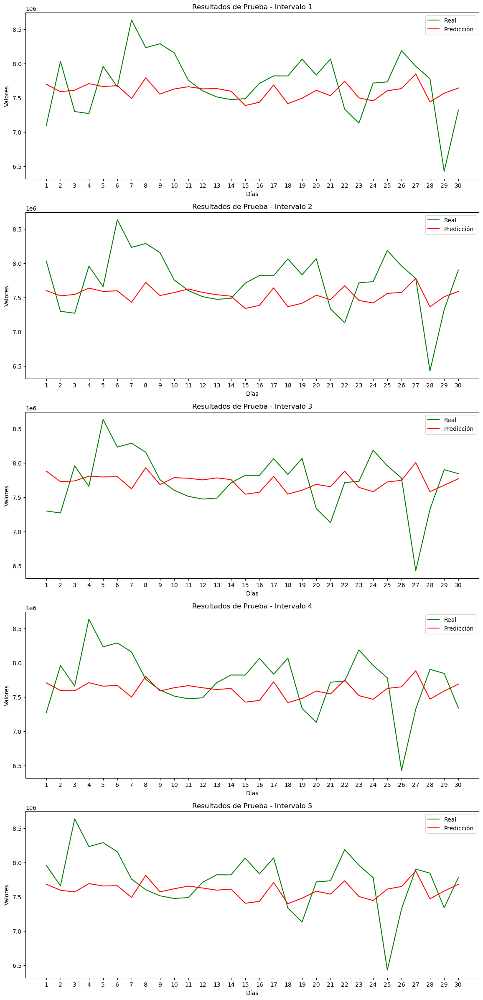

In [68]:
trainPredict = best_model_CNN_meta.predict(X_train)
testPredict = best_model_CNN_meta.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 10

MLP

In [69]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_10')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

X = matriz_modelo_nsantander.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_nsantander[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_nsantander = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_nsantander.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 23s]
val_loss: 357564.15625

Best val_loss So Far: 320831.625
Total elapsed time: 00h 19m 12s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 359271.5938
Test Loss: 343631.53125


In [70]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_nsantander = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_nsantander)

{'units_1': 96, 'units_2': 448, 'units_3': 192, 'learning_rate': 0.0016867868524984377, 'tuner/epochs': 20, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


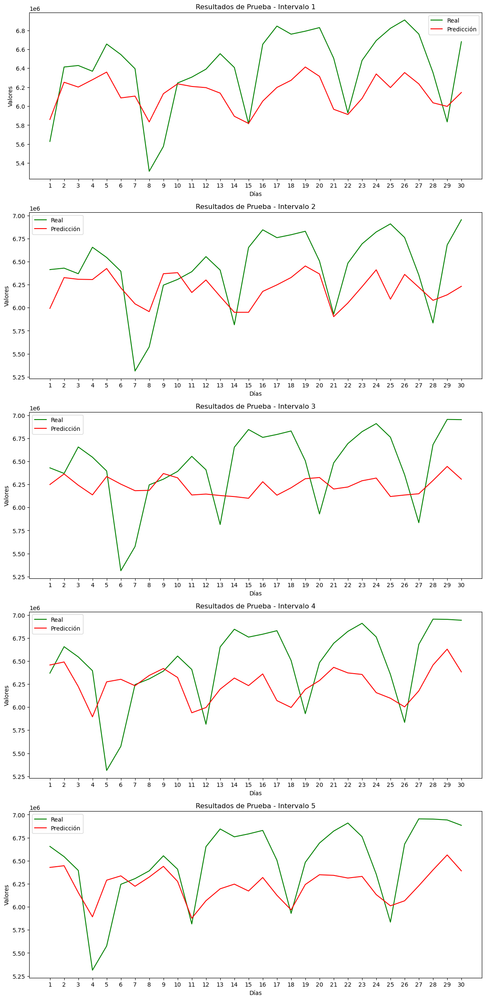

In [71]:
trainPredict = best_model_MLP_nsantander.predict(X_train)
testPredict = best_model_MLP_nsantander.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [72]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_10')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_nsantander = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_nsantander.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 28s]
val_loss: 334005.90625

Best val_loss So Far: 305065.21875
Total elapsed time: 00h 24m 02s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 366780.1875
Test Loss: 353935.125


In [73]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_nsantander = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_nsantander)

{'filters_1': 64, 'kernel_size_1': 3, 'filters_2': 128, 'kernel_size_2': 5, 'units_dense': 256, 'learning_rate': 0.00032748237453410103, 'tuner/epochs': 20, 'tuner/initial_epoch': 7, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0044'}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


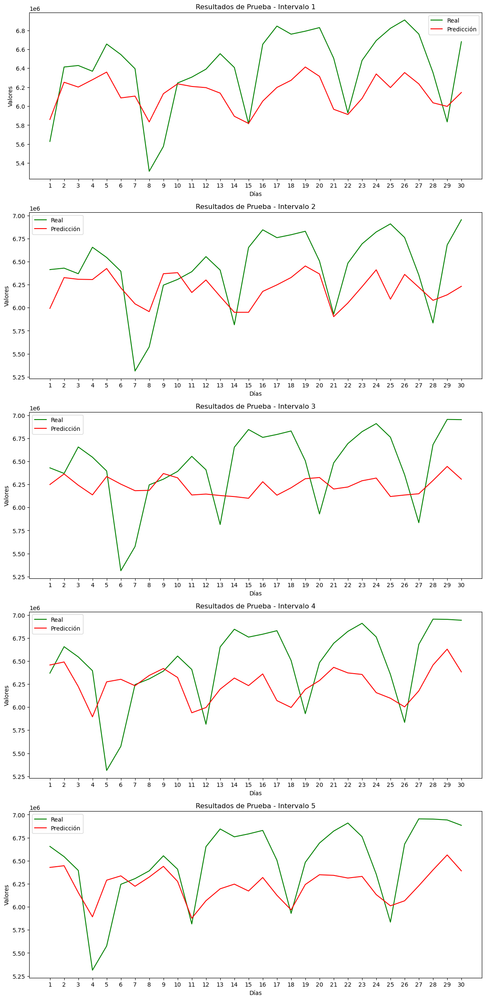

In [74]:
trainPredict = best_model_MLP_nsantander.predict(X_train)
testPredict = best_model_MLP_nsantander.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

# Modelos finales con más épocas

In [75]:
def modelo_MLP(X_train, Y_train, dense_1, dense_2, dense_3, learning_rate, epochs):
    # Construcción del modelo
    model = Sequential(name="MLP")
    model.add(Dense(dense_1, input_dim=240, activation='relu'))
    model.add(Dense(dense_2, activation='relu'))
    model.add(Dense(dense_3, activation='relu'))
    model.add(Dense(30, activation='linear'))

    # Compilación del modelo
    model.compile(loss='mae', optimizer=Adam(learning_rate=learning_rate))

    # Entrenamiento con early stopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    history = model.fit(X_train, Y_train, 
                        validation_split=0.2, 
                        epochs=epochs, 
                        batch_size=64, 
                        verbose=2, 
                        callbacks=[early_stopping])
    
    return model

In [76]:
def modelo_CNN(X_train, Y_train, filter_1, kn_size_1, filter_2, kn_size_2, dense, learning_rate, epochs):
    # Construcción del modelo CNN
    model = Sequential(name="CNN")

    # Capa convolucional 1D para datos secuenciales
    model.add(Conv1D(filters=filter_1, kernel_size=kn_size_1, activation='relu', input_shape=(240, 1)))
    model.add(MaxPooling1D(pool_size=2))  # Reducción de dimensionalidad

    # Otra capa convolucional y de pooling
    model.add(Conv1D(filters=filter_2, kernel_size=kn_size_2, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))

    # Aplanar y agregar capas densas
    model.add(Flatten())
    model.add(Dense(dense, activation='relu'))
    model.add(Dense(30, activation='linear'))  # Salida para regresión

    # Compilación del modelo
    model.compile(loss='mae', optimizer=Adam(learning_rate=learning_rate))

    # Entrenamiento con early stopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    history = model.fit(X_train, Y_train, 
                        validation_split=0.2, 
                        epochs=epochs, 
                        batch_size=64, 
                        verbose=2, 
                        callbacks=[early_stopping])
    
    return model

## Ciudad 1

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 406ms/step - loss: 13692334.0000 - val_loss: 4716723.0000
Epoch 2/500
12/12 - 0s - 24ms/step - loss: 3987698.7500 - val_loss: 3413657.0000
Epoch 3/500
12/12 - 0s - 25ms/step - loss: 3085485.0000 - val_loss: 3052245.5000
Epoch 4/500
12/12 - 0s - 25ms/step - loss: 2960916.2500 - val_loss: 2934355.7500
Epoch 5/500
12/12 - 0s - 24ms/step - loss: 2831308.0000 - val_loss: 2819461.2500
Epoch 6/500
12/12 - 0s - 24ms/step - loss: 2658699.0000 - val_loss: 2652671.5000
Epoch 7/500
12/12 - 0s - 24ms/step - loss: 2713145.7500 - val_loss: 3067862.5000
Epoch 8/500
12/12 - 0s - 24ms/step - loss: 2747317.7500 - val_loss: 2922499.7500
Epoch 9/500
12/12 - 0s - 25ms/step - loss: 2570600.2500 - val_loss: 2747914.7500
Epoch 10/500
12/12 - 0s - 25ms/step - loss: 2482511.7500 - val_loss: 2597294.0000
Epoch 11/500
12/12 - 0s - 25ms/step - loss: 2481299.7500 - val_loss: 2345238.5000
Epoch 12/500
12/12 - 0s - 25ms/step - loss: 2281737.2500 - val_loss: 2237471.0000
Epoch 13/500
12/12 - 0s

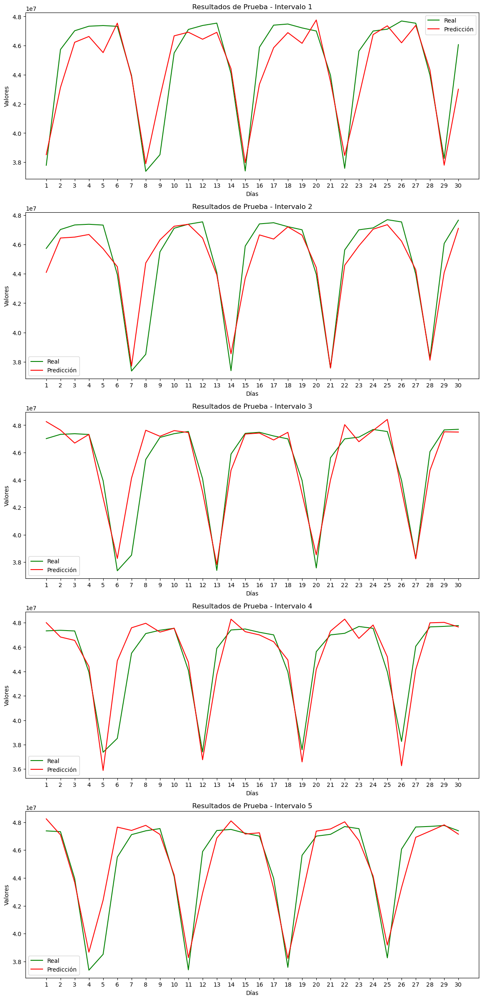

In [77]:
X = matriz_modelo_bogota.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_bogota[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_bogota = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_bogota['units_1'], dense_2 = best_hyperparameters_MLP_bogota['units_2'], 
                               dense_3 = best_hyperparameters_MLP_bogota['units_3'], learning_rate = best_hyperparameters_MLP_bogota['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_bogota.predict(X_train)
testPredict = modelo_MLP_bogota.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 6s - 511ms/step - loss: 22620994.0000 - val_loss: 9392548.0000
Epoch 2/500
12/12 - 1s - 85ms/step - loss: 6144326.0000 - val_loss: 4184232.0000
Epoch 3/500
12/12 - 1s - 88ms/step - loss: 3484679.2500 - val_loss: 2998545.2500
Epoch 4/500
12/12 - 1s - 83ms/step - loss: 2829820.5000 - val_loss: 2803014.7500
Epoch 5/500
12/12 - 1s - 83ms/step - loss: 2629552.0000 - val_loss: 2702990.2500
Epoch 6/500
12/12 - 1s - 81ms/step - loss: 2601074.2500 - val_loss: 2706635.2500
Epoch 7/500
12/12 - 1s - 84ms/step - loss: 2593319.0000 - val_loss: 2624146.5000
Epoch 8/500
12/12 - 1s - 86ms/step - loss: 2462670.0000 - val_loss: 2491935.0000
Epoch 9/500
12/12 - 1s - 88ms/step - loss: 2426928.7500 - val_loss: 2487241.0000
Epoch 10/500
12/12 - 1s - 91ms/step - loss: 2374038.5000 - val_loss: 2356521.5000
Epoch 11/500
12/12 - 1s - 90ms/step - loss: 2235492.2500 - val_loss: 2322908.7500
Epoch 12/500
12/12 - 1s - 91ms/step - loss: 2219060.0000 - val_loss: 2259094.2500
Epoch 13/500
12/12 - 1s

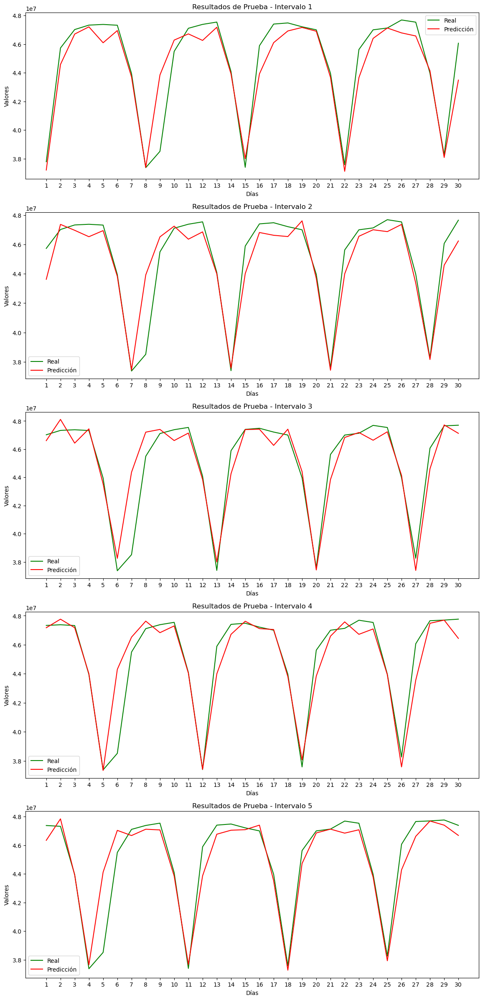

In [78]:
X = matriz_modelo_bogota.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_bogota[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_bogota = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_bogota['filters_1'], kn_size_1 = best_hyperparameters_CNN_bogota['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_bogota['filters_2'], kn_size_2 = best_hyperparameters_CNN_bogota['kernel_size_2'], dense = best_hyperparameters_CNN_bogota['units_dense'],
                                learning_rate = best_hyperparameters_CNN_bogota['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_bogota.predict(X_train)
testPredict = modelo_CNN_bogota.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 2

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 391ms/step - loss: 22272734.0000 - val_loss: 8948840.0000
Epoch 2/500
12/12 - 0s - 20ms/step - loss: 5590956.5000 - val_loss: 4112591.2500
Epoch 3/500
12/12 - 0s - 20ms/step - loss: 2519564.2500 - val_loss: 2259992.0000
Epoch 4/500
12/12 - 0s - 20ms/step - loss: 1465605.2500 - val_loss: 1582838.3750
Epoch 5/500
12/12 - 0s - 19ms/step - loss: 1190950.8750 - val_loss: 1465106.8750
Epoch 6/500
12/12 - 0s - 20ms/step - loss: 1117162.5000 - val_loss: 1402520.5000
Epoch 7/500
12/12 - 0s - 19ms/step - loss: 1117105.8750 - val_loss: 1494174.6250
Epoch 8/500
12/12 - 0s - 18ms/step - loss: 1108662.1250 - val_loss: 1411385.8750
Epoch 9/500
12/12 - 0s - 18ms/step - loss: 1123373.8750 - val_loss: 1553849.2500
Epoch 10/500
12/12 - 0s - 19ms/step - loss: 1108860.3750 - val_loss: 1450674.8750
Epoch 11/500
12/12 - 0s - 19ms/step - loss: 1113638.2500 - val_loss: 1441958.6250
Epoch 12/500
12/12 - 0s - 19ms/step - loss: 1114559.1250 - val_loss: 1496753.1250
Epoch 13/500
12/12 - 0s

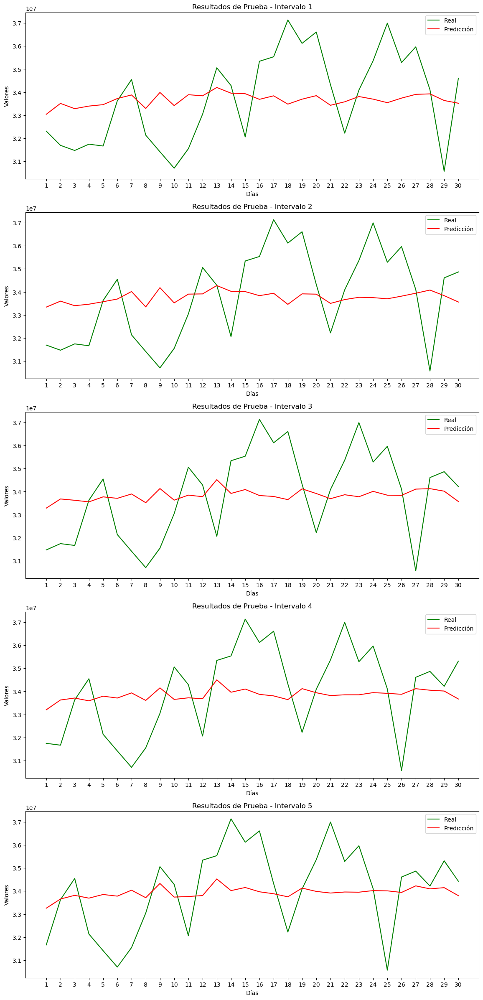

In [79]:
X = matriz_modelo_cm.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cm[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_cm = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_cm['units_1'], dense_2 = best_hyperparameters_MLP_cm['units_2'], 
                               dense_3 = best_hyperparameters_MLP_cm['units_3'], learning_rate = best_hyperparameters_MLP_cm['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_cm.predict(X_train)
testPredict = modelo_MLP_cm.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 443ms/step - loss: 17992028.0000 - val_loss: 8934506.0000
Epoch 2/500
12/12 - 0s - 35ms/step - loss: 6402303.5000 - val_loss: 4063942.7500
Epoch 3/500
12/12 - 0s - 35ms/step - loss: 2630386.0000 - val_loss: 2056051.5000
Epoch 4/500
12/12 - 0s - 36ms/step - loss: 1504515.0000 - val_loss: 1583339.5000
Epoch 5/500
12/12 - 0s - 34ms/step - loss: 1230865.6250 - val_loss: 1470120.6250
Epoch 6/500
12/12 - 0s - 34ms/step - loss: 1159886.6250 - val_loss: 1566859.1250
Epoch 7/500
12/12 - 0s - 33ms/step - loss: 1154725.2500 - val_loss: 1492685.8750
Epoch 8/500
12/12 - 0s - 34ms/step - loss: 1120675.5000 - val_loss: 1420387.2500
Epoch 9/500
12/12 - 0s - 34ms/step - loss: 1146089.1250 - val_loss: 1436934.2500
Epoch 10/500
12/12 - 0s - 35ms/step - loss: 1123851.6250 - val_loss: 1586663.3750
Epoch 11/500
12/12 - 0s - 35ms/step - loss: 1113762.0000 - val_loss: 1411047.3750
Epoch 12/500
12/12 - 0s - 36ms/step - loss: 1112527.0000 - val_loss: 1435491.8750
Epoch 13/500
12/12 - 0s

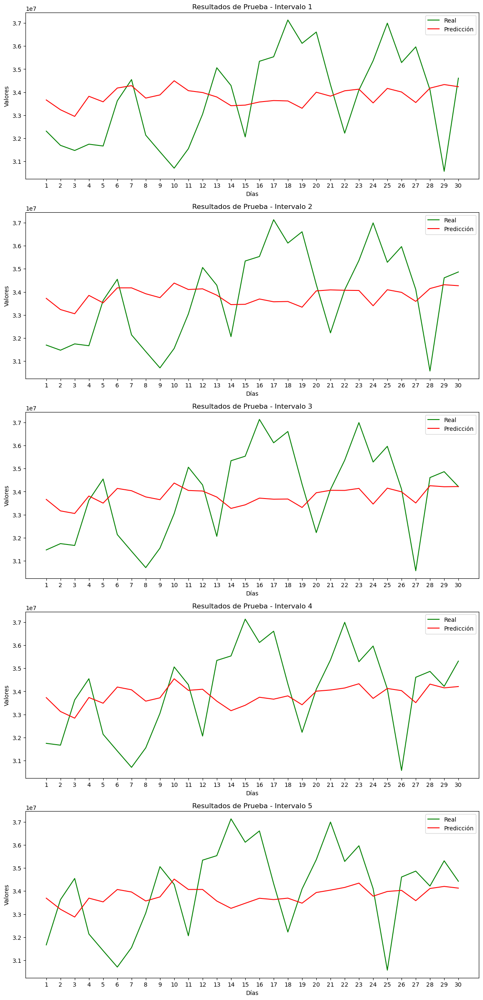

In [80]:
X = matriz_modelo_cm.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cm[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_cm = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_cm['filters_1'], kn_size_1 = best_hyperparameters_CNN_cm['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_cm['filters_2'], kn_size_2 = best_hyperparameters_CNN_cm['kernel_size_2'], dense = best_hyperparameters_CNN_cm['units_dense'],
                                learning_rate = best_hyperparameters_CNN_cm['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_cm.predict(X_train)
testPredict = modelo_CNN_cm.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 3

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 422ms/step - loss: 8573269.0000 - val_loss: 3503551.7500
Epoch 2/500
12/12 - 0s - 25ms/step - loss: 2529028.0000 - val_loss: 2243856.7500
Epoch 3/500
12/12 - 0s - 26ms/step - loss: 1985013.7500 - val_loss: 1833068.8750
Epoch 4/500
12/12 - 0s - 24ms/step - loss: 1669013.5000 - val_loss: 1814412.1250
Epoch 5/500
12/12 - 0s - 24ms/step - loss: 1593722.5000 - val_loss: 1798375.8750
Epoch 6/500
12/12 - 0s - 25ms/step - loss: 1704371.0000 - val_loss: 1833716.5000
Epoch 7/500
12/12 - 0s - 24ms/step - loss: 1545124.3750 - val_loss: 1652523.1250
Epoch 8/500
12/12 - 0s - 25ms/step - loss: 1461357.2500 - val_loss: 1503323.5000
Epoch 9/500
12/12 - 0s - 25ms/step - loss: 1470284.3750 - val_loss: 1486205.3750
Epoch 10/500
12/12 - 0s - 25ms/step - loss: 1596242.8750 - val_loss: 2764673.0000
Epoch 11/500
12/12 - 0s - 25ms/step - loss: 2081935.6250 - val_loss: 1921383.5000
Epoch 12/500
12/12 - 0s - 25ms/step - loss: 1610926.1250 - val_loss: 1599585.1250
Epoch 13/500
12/12 - 0s 

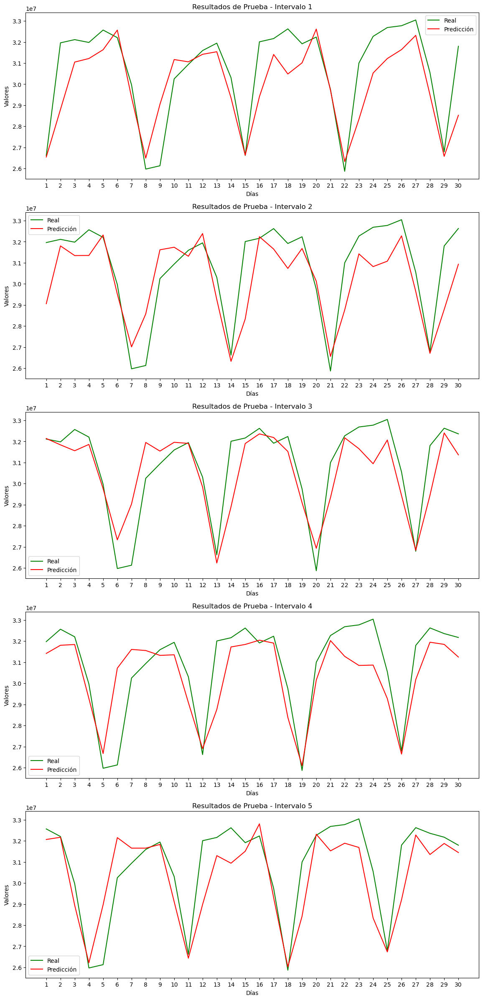

In [81]:
X = matriz_modelo_antioquia.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_antioquia[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_antioquia = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_antioquia['units_1'], dense_2 = best_hyperparameters_MLP_antioquia['units_2'], 
                               dense_3 = best_hyperparameters_MLP_antioquia['units_3'], learning_rate = best_hyperparameters_MLP_antioquia['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_antioquia.predict(X_train)
testPredict = modelo_MLP_antioquia.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 6s - 474ms/step - loss: 10495076.0000 - val_loss: 3856855.0000
Epoch 2/500
12/12 - 1s - 58ms/step - loss: 3026264.0000 - val_loss: 2351403.7500
Epoch 3/500
12/12 - 1s - 56ms/step - loss: 2028936.6250 - val_loss: 2014890.2500
Epoch 4/500
12/12 - 1s - 53ms/step - loss: 1862745.5000 - val_loss: 1837153.3750
Epoch 5/500
12/12 - 1s - 55ms/step - loss: 1664669.5000 - val_loss: 2054131.1250
Epoch 6/500
12/12 - 1s - 55ms/step - loss: 1623829.5000 - val_loss: 1899801.6250
Epoch 7/500
12/12 - 1s - 58ms/step - loss: 1623357.3750 - val_loss: 1631163.3750
Epoch 8/500
12/12 - 1s - 55ms/step - loss: 1468405.5000 - val_loss: 1797022.0000
Epoch 9/500
12/12 - 1s - 57ms/step - loss: 1500370.1250 - val_loss: 1523435.5000
Epoch 10/500
12/12 - 1s - 57ms/step - loss: 1434341.1250 - val_loss: 1460505.2500
Epoch 11/500
12/12 - 1s - 56ms/step - loss: 1424979.5000 - val_loss: 1479847.5000
Epoch 12/500
12/12 - 1s - 54ms/step - loss: 1355014.0000 - val_loss: 1576963.6250
Epoch 13/500
12/12 - 1s

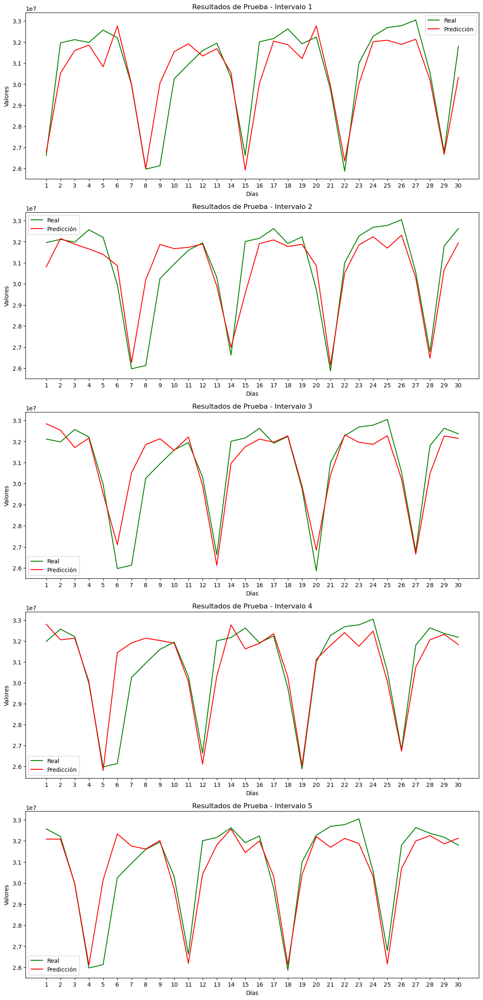

In [82]:
X = matriz_modelo_antioquia.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_antioquia[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_antioquia = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_antioquia['filters_1'], kn_size_1 = best_hyperparameters_CNN_antioquia['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_antioquia['filters_2'], kn_size_2 = best_hyperparameters_CNN_antioquia['kernel_size_2'], dense = best_hyperparameters_CNN_antioquia['units_dense'],
                                learning_rate = best_hyperparameters_CNN_antioquia['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_antioquia.predict(X_train)
testPredict = modelo_CNN_antioquia.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 4

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 398ms/step - loss: 10982210.0000 - val_loss: 4019629.0000
Epoch 2/500
12/12 - 0s - 20ms/step - loss: 2488973.7500 - val_loss: 1781595.5000
Epoch 3/500
12/12 - 0s - 20ms/step - loss: 1483004.7500 - val_loss: 1756007.5000
Epoch 4/500
12/12 - 0s - 19ms/step - loss: 1252121.3750 - val_loss: 1389110.3750
Epoch 5/500
12/12 - 0s - 17ms/step - loss: 1240294.5000 - val_loss: 2062909.1250
Epoch 6/500
12/12 - 0s - 18ms/step - loss: 1262211.6250 - val_loss: 1292467.5000
Epoch 7/500
12/12 - 0s - 19ms/step - loss: 1231163.2500 - val_loss: 1887220.5000
Epoch 8/500
12/12 - 0s - 20ms/step - loss: 1249686.2500 - val_loss: 1377624.5000
Epoch 9/500
12/12 - 0s - 20ms/step - loss: 1224894.8750 - val_loss: 1719017.0000
Epoch 10/500
12/12 - 0s - 19ms/step - loss: 1227513.0000 - val_loss: 1882911.6250
Epoch 11/500
12/12 - 0s - 19ms/step - loss: 1214797.1250 - val_loss: 1260180.5000
Epoch 12/500
12/12 - 0s - 18ms/step - loss: 1214925.6250 - val_loss: 1547384.1250
Epoch 13/500
12/12 - 0s

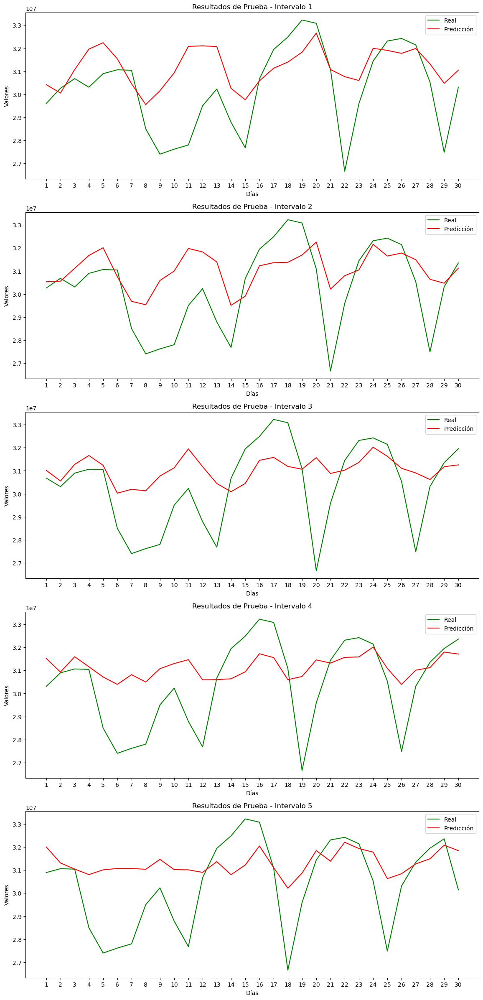

In [83]:
X = matriz_modelo_cs.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cs[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_cs = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_cs['units_1'], dense_2 = best_hyperparameters_MLP_cs['units_2'], 
                               dense_3 = best_hyperparameters_MLP_cs['units_3'], learning_rate = best_hyperparameters_MLP_cs['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_cs.predict(X_train)
testPredict = modelo_MLP_cs.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 6s - 464ms/step - loss: 12347872.0000 - val_loss: 5829207.0000
Epoch 2/500
12/12 - 1s - 48ms/step - loss: 3547095.2500 - val_loss: 2360131.5000
Epoch 3/500
12/12 - 1s - 46ms/step - loss: 1715519.0000 - val_loss: 1427064.6250
Epoch 4/500
12/12 - 1s - 48ms/step - loss: 1502852.1250 - val_loss: 1344916.3750
Epoch 5/500
12/12 - 1s - 47ms/step - loss: 1509867.3750 - val_loss: 1245900.0000
Epoch 6/500
12/12 - 1s - 47ms/step - loss: 1406664.1250 - val_loss: 1212727.3750
Epoch 7/500
12/12 - 1s - 46ms/step - loss: 1267220.3750 - val_loss: 1606719.5000
Epoch 8/500
12/12 - 1s - 42ms/step - loss: 1252720.8750 - val_loss: 1831965.0000
Epoch 9/500
12/12 - 1s - 48ms/step - loss: 1222085.8750 - val_loss: 1385977.7500
Epoch 10/500
12/12 - 1s - 51ms/step - loss: 1189358.1250 - val_loss: 1387302.3750
Epoch 11/500
12/12 - 1s - 49ms/step - loss: 1200799.5000 - val_loss: 2185949.2500
Epoch 12/500
12/12 - 1s - 47ms/step - loss: 1238460.8750 - val_loss: 1472522.2500
Epoch 13/500
12/12 - 1s

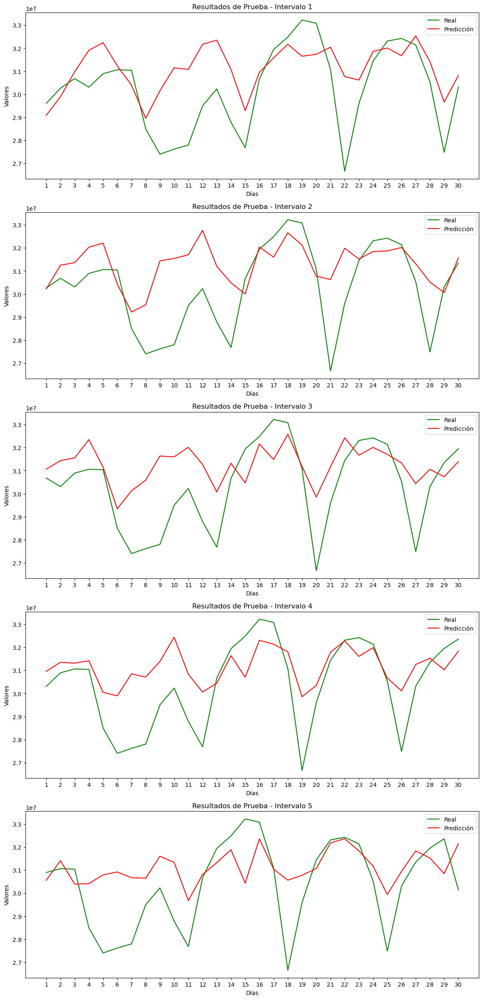

In [84]:
X = matriz_modelo_cs.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cs[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_cs = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_cs['filters_1'], kn_size_1 = best_hyperparameters_CNN_cs['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_cs['filters_2'], kn_size_2 = best_hyperparameters_CNN_cs['kernel_size_2'], dense = best_hyperparameters_CNN_cs['units_dense'],
                                learning_rate = best_hyperparameters_CNN_cs['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_cs.predict(X_train)
testPredict = modelo_CNN_cs.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 5

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 407ms/step - loss: 5463418.5000 - val_loss: 2060692.0000
Epoch 2/500
12/12 - 0s - 21ms/step - loss: 1520058.3750 - val_loss: 1337945.2500
Epoch 3/500
12/12 - 0s - 21ms/step - loss: 1094283.2500 - val_loss: 1018974.0625
Epoch 4/500
12/12 - 0s - 19ms/step - loss: 947064.3750 - val_loss: 1047337.1875
Epoch 5/500
12/12 - 0s - 17ms/step - loss: 932546.0000 - val_loss: 953735.2500
Epoch 6/500
12/12 - 0s - 18ms/step - loss: 917394.6875 - val_loss: 931813.2500
Epoch 7/500
12/12 - 0s - 20ms/step - loss: 896029.6875 - val_loss: 1020768.1875
Epoch 8/500
12/12 - 0s - 20ms/step - loss: 912324.5000 - val_loss: 1024662.5000
Epoch 9/500
12/12 - 0s - 24ms/step - loss: 895481.3750 - val_loss: 905929.6250
Epoch 10/500
12/12 - 0s - 24ms/step - loss: 862427.0625 - val_loss: 847721.3125
Epoch 11/500
12/12 - 0s - 21ms/step - loss: 842265.5000 - val_loss: 869969.9375
Epoch 12/500
12/12 - 0s - 20ms/step - loss: 849287.1875 - val_loss: 828375.4375
Epoch 13/500
12/12 - 0s - 20ms/step - l

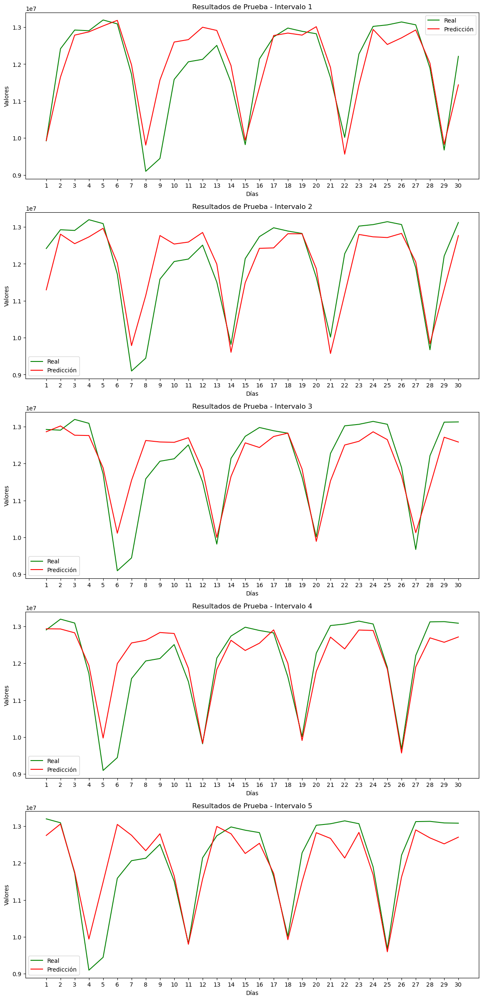

In [85]:
X = matriz_modelo_cali.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cali[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_cali = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_cali['units_1'], dense_2 = best_hyperparameters_MLP_cali['units_2'], 
                               dense_3 = best_hyperparameters_MLP_cali['units_3'], learning_rate = best_hyperparameters_MLP_cali['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_cali.predict(X_train)
testPredict = modelo_MLP_cali.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 6s - 503ms/step - loss: 4066174.5000 - val_loss: 1479685.0000
Epoch 2/500
12/12 - 1s - 82ms/step - loss: 1185402.2500 - val_loss: 1081631.8750
Epoch 3/500
12/12 - 1s - 77ms/step - loss: 988783.8125 - val_loss: 1114817.2500
Epoch 4/500
12/12 - 1s - 80ms/step - loss: 1016068.0000 - val_loss: 1583583.1250
Epoch 5/500
12/12 - 1s - 78ms/step - loss: 1205655.2500 - val_loss: 1236091.5000
Epoch 6/500
12/12 - 1s - 78ms/step - loss: 1017273.9375 - val_loss: 1032274.7500
Epoch 7/500
12/12 - 1s - 80ms/step - loss: 917284.0000 - val_loss: 916404.7500
Epoch 8/500
12/12 - 1s - 79ms/step - loss: 887596.5000 - val_loss: 877082.8750
Epoch 9/500
12/12 - 1s - 78ms/step - loss: 851527.8125 - val_loss: 916657.3125
Epoch 10/500
12/12 - 1s - 79ms/step - loss: 850061.6250 - val_loss: 893660.9375
Epoch 11/500
12/12 - 1s - 78ms/step - loss: 880879.6875 - val_loss: 956436.6250
Epoch 12/500
12/12 - 1s - 79ms/step - loss: 850759.1875 - val_loss: 759045.1875
Epoch 13/500
12/12 - 1s - 80ms/step -

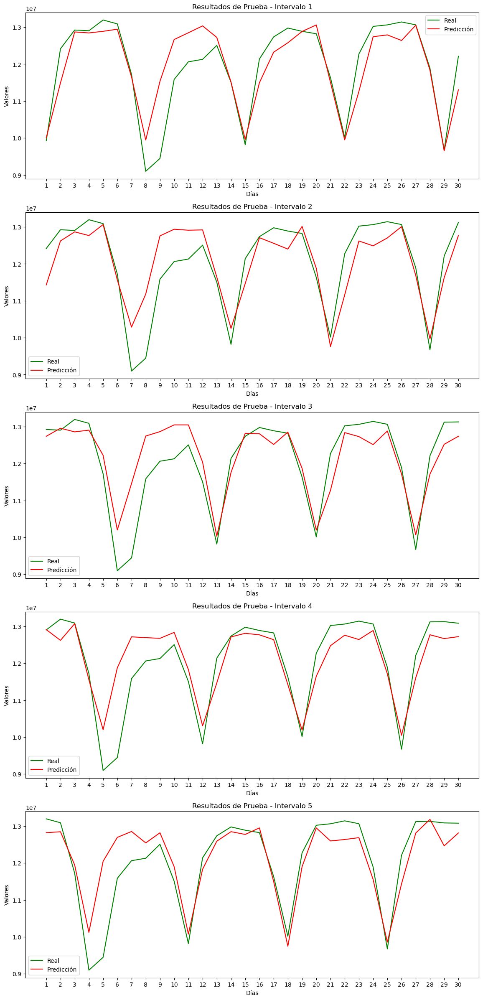

In [86]:
X = matriz_modelo_cali.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cali[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_cali = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_cali['filters_1'], kn_size_1 = best_hyperparameters_CNN_cali['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_cali['filters_2'], kn_size_2 = best_hyperparameters_CNN_cali['kernel_size_2'], dense = best_hyperparameters_CNN_cali['units_dense'],
                                learning_rate = best_hyperparameters_CNN_cali['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_cali.predict(X_train)
testPredict = modelo_CNN_cali.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciduad 6

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 391ms/step - loss: 5202512.5000 - val_loss: 1310398.2500
Epoch 2/500
12/12 - 0s - 21ms/step - loss: 1010656.3750 - val_loss: 817777.0000
Epoch 3/500
12/12 - 0s - 21ms/step - loss: 602963.8750 - val_loss: 624290.0000
Epoch 4/500
12/12 - 0s - 20ms/step - loss: 488203.0000 - val_loss: 606929.6875
Epoch 5/500
12/12 - 0s - 19ms/step - loss: 463804.3750 - val_loss: 574899.5000
Epoch 6/500
12/12 - 0s - 21ms/step - loss: 450935.5938 - val_loss: 572496.8750
Epoch 7/500
12/12 - 0s - 20ms/step - loss: 441809.0000 - val_loss: 576388.6875
Epoch 8/500
12/12 - 0s - 21ms/step - loss: 438577.8125 - val_loss: 562188.0000
Epoch 9/500
12/12 - 0s - 19ms/step - loss: 434932.0938 - val_loss: 562019.3125
Epoch 10/500
12/12 - 0s - 21ms/step - loss: 434248.5625 - val_loss: 556943.6250
Epoch 11/500
12/12 - 0s - 19ms/step - loss: 432222.6875 - val_loss: 580035.0625
Epoch 12/500
12/12 - 0s - 20ms/step - loss: 446612.5312 - val_loss: 565040.5625
Epoch 13/500
12/12 - 0s - 21ms/step - loss: 4

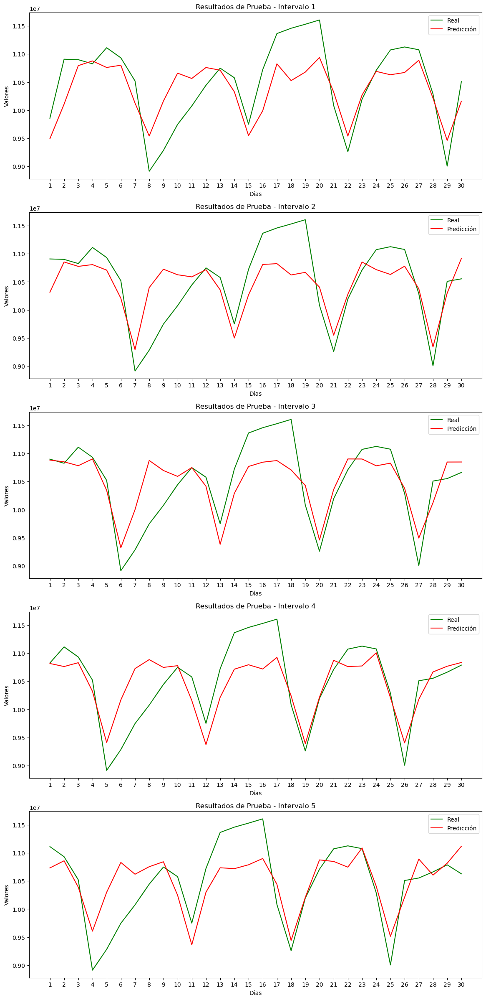

In [87]:
X = matriz_modelo_santander.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_santander[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_santander = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_santander['units_1'], dense_2 = best_hyperparameters_MLP_santander['units_2'], 
                               dense_3 = best_hyperparameters_MLP_santander['units_3'], learning_rate = best_hyperparameters_MLP_santander['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_santander.predict(X_train)
testPredict = modelo_MLP_santander.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 6s - 483ms/step - loss: 3603244.5000 - val_loss: 1061621.8750
Epoch 2/500
12/12 - 1s - 58ms/step - loss: 804478.3125 - val_loss: 737594.1875
Epoch 3/500
12/12 - 1s - 57ms/step - loss: 556986.0625 - val_loss: 606781.1250
Epoch 4/500
12/12 - 1s - 59ms/step - loss: 481254.5312 - val_loss: 585092.3125
Epoch 5/500
12/12 - 1s - 58ms/step - loss: 459231.8125 - val_loss: 565522.8750
Epoch 6/500
12/12 - 1s - 58ms/step - loss: 437160.1562 - val_loss: 556814.7500
Epoch 7/500
12/12 - 1s - 57ms/step - loss: 430317.2500 - val_loss: 563739.3750
Epoch 8/500
12/12 - 1s - 57ms/step - loss: 435054.0938 - val_loss: 562384.2500
Epoch 9/500
12/12 - 1s - 54ms/step - loss: 446345.3125 - val_loss: 584711.9375
Epoch 10/500
12/12 - 1s - 57ms/step - loss: 493057.8750 - val_loss: 559070.8750
Epoch 11/500
12/12 - 1s - 57ms/step - loss: 449779.5938 - val_loss: 600833.2500
Epoch 12/500
12/12 - 1s - 59ms/step - loss: 458083.6562 - val_loss: 550956.1875
Epoch 13/500
12/12 - 1s - 58ms/step - loss: 42

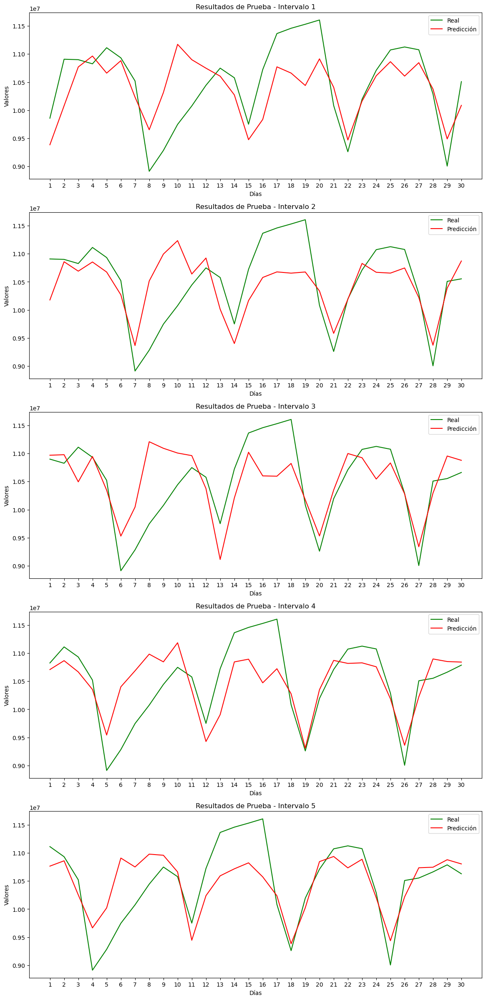

In [88]:
X = matriz_modelo_santander.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_santander[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_santander = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_santander['filters_1'], kn_size_1 = best_hyperparameters_CNN_santander['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_santander['filters_2'], kn_size_2 = best_hyperparameters_CNN_santander['kernel_size_2'], dense = best_hyperparameters_CNN_santander['units_dense'],
                                learning_rate = best_hyperparameters_CNN_santander['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_santander.predict(X_train)
testPredict = modelo_CNN_santander.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciduad 7

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 397ms/step - loss: 7198434.5000 - val_loss: 4114675.7500
Epoch 2/500
12/12 - 0s - 21ms/step - loss: 2308445.2500 - val_loss: 903370.8125
Epoch 3/500
12/12 - 0s - 23ms/step - loss: 866505.8750 - val_loss: 766673.6250
Epoch 4/500
12/12 - 0s - 21ms/step - loss: 603246.5625 - val_loss: 544333.7500
Epoch 5/500
12/12 - 0s - 21ms/step - loss: 504478.1250 - val_loss: 475499.6562
Epoch 6/500
12/12 - 0s - 21ms/step - loss: 484636.1562 - val_loss: 485503.9062
Epoch 7/500
12/12 - 0s - 21ms/step - loss: 478407.1250 - val_loss: 494125.7188
Epoch 8/500
12/12 - 0s - 21ms/step - loss: 477398.1875 - val_loss: 487036.2500
Epoch 9/500
12/12 - 0s - 22ms/step - loss: 478213.6875 - val_loss: 512603.6562
Epoch 10/500
12/12 - 0s - 22ms/step - loss: 473462.0312 - val_loss: 483799.2812
Epoch 11/500
12/12 - 0s - 23ms/step - loss: 472468.7188 - val_loss: 488551.1562
Epoch 12/500
12/12 - 0s - 22ms/step - loss: 475168.2812 - val_loss: 496835.2188
Epoch 13/500
12/12 - 0s - 21ms/step - loss: 4

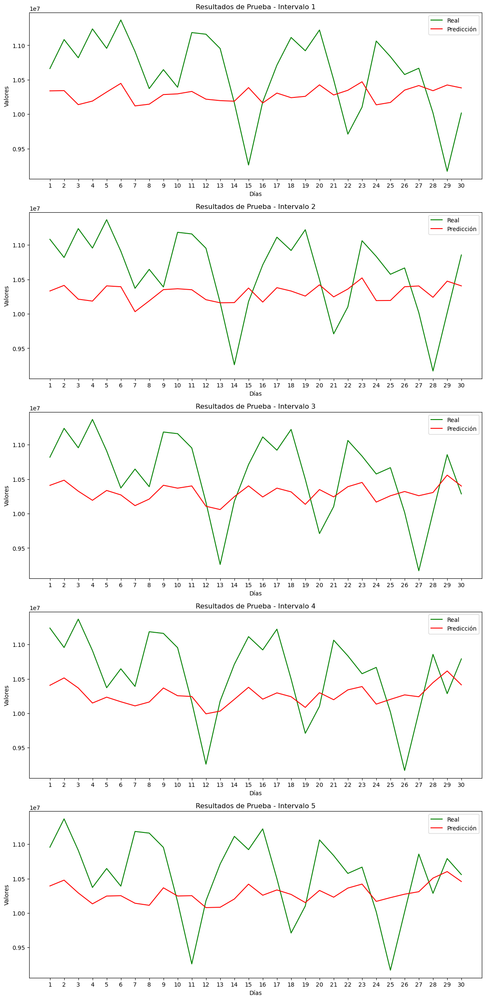

In [89]:
X = matriz_modelo_boyaca.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_boyaca[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_boyaca = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_boyaca['units_1'], dense_2 = best_hyperparameters_MLP_boyaca['units_2'], 
                               dense_3 = best_hyperparameters_MLP_boyaca['units_3'], learning_rate = best_hyperparameters_MLP_boyaca['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_boyaca.predict(X_train)
testPredict = modelo_MLP_boyaca.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 6s - 514ms/step - loss: 8559542.0000 - val_loss: 8131145.5000
Epoch 2/500
12/12 - 1s - 92ms/step - loss: 6178357.5000 - val_loss: 4953744.5000
Epoch 3/500
12/12 - 1s - 92ms/step - loss: 3681028.7500 - val_loss: 2881089.7500
Epoch 4/500
12/12 - 1s - 89ms/step - loss: 2090926.5000 - val_loss: 1667625.8750
Epoch 5/500
12/12 - 1s - 89ms/step - loss: 1308339.2500 - val_loss: 1040381.9375
Epoch 6/500
12/12 - 1s - 90ms/step - loss: 840935.0000 - val_loss: 701290.8750
Epoch 7/500
12/12 - 1s - 90ms/step - loss: 557901.0000 - val_loss: 534450.4375
Epoch 8/500
12/12 - 1s - 91ms/step - loss: 488366.4688 - val_loss: 514464.7188
Epoch 9/500
12/12 - 1s - 88ms/step - loss: 472099.6562 - val_loss: 466079.7188
Epoch 10/500
12/12 - 1s - 89ms/step - loss: 465286.2812 - val_loss: 464622.5625
Epoch 11/500
12/12 - 1s - 82ms/step - loss: 462701.2812 - val_loss: 463150.6250
Epoch 12/500
12/12 - 1s - 82ms/step - loss: 461747.7500 - val_loss: 460151.0312
Epoch 13/500
12/12 - 1s - 88ms/step - 

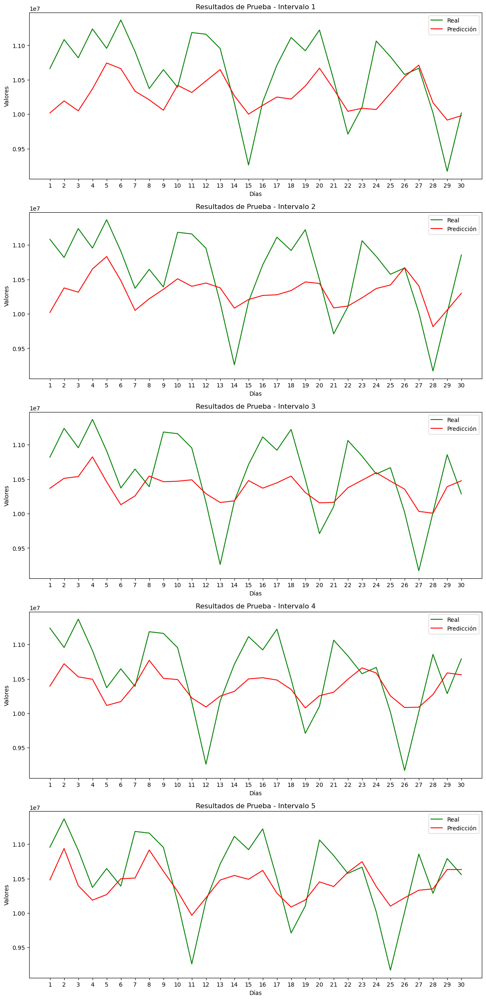

In [90]:
X = matriz_modelo_boyaca.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_boyaca[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_boyaca = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_boyaca['filters_1'], kn_size_1 = best_hyperparameters_CNN_boyaca['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_boyaca['filters_2'], kn_size_2 = best_hyperparameters_CNN_boyaca['kernel_size_2'], dense = best_hyperparameters_CNN_boyaca['units_dense'],
                                learning_rate = best_hyperparameters_CNN_boyaca['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_boyaca.predict(X_train)
testPredict = modelo_CNN_boyaca.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 8

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 388ms/step - loss: 3632302.7500 - val_loss: 1115190.0000
Epoch 2/500
12/12 - 0s - 21ms/step - loss: 918586.6250 - val_loss: 682344.8750
Epoch 3/500
12/12 - 0s - 21ms/step - loss: 589737.5625 - val_loss: 519474.8125
Epoch 4/500
12/12 - 0s - 21ms/step - loss: 501218.3750 - val_loss: 480945.2812
Epoch 5/500
12/12 - 0s - 20ms/step - loss: 481587.8125 - val_loss: 461527.5000
Epoch 6/500
12/12 - 0s - 21ms/step - loss: 473335.5938 - val_loss: 451183.6875
Epoch 7/500
12/12 - 0s - 20ms/step - loss: 468109.9062 - val_loss: 480475.5000
Epoch 8/500
12/12 - 0s - 20ms/step - loss: 470932.5000 - val_loss: 468536.0312
Epoch 9/500
12/12 - 0s - 20ms/step - loss: 459297.2188 - val_loss: 439639.3438
Epoch 10/500
12/12 - 0s - 21ms/step - loss: 454872.5625 - val_loss: 458233.8438
Epoch 11/500
12/12 - 0s - 20ms/step - loss: 462922.5625 - val_loss: 445220.7500
Epoch 12/500
12/12 - 0s - 20ms/step - loss: 452398.5000 - val_loss: 441761.5312
Epoch 13/500
12/12 - 0s - 21ms/step - loss: 44

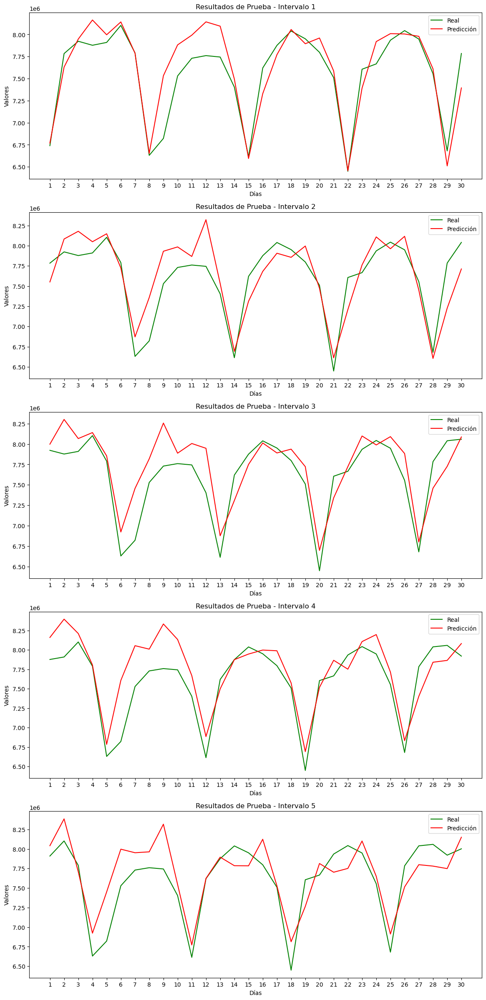

In [91]:
X = matriz_modelo_vcauca.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_vcauca[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_vcauca = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_vcauca['units_1'], dense_2 = best_hyperparameters_MLP_vcauca['units_2'], 
                               dense_3 = best_hyperparameters_MLP_vcauca['units_3'], learning_rate = best_hyperparameters_MLP_vcauca['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_vcauca.predict(X_train)
testPredict = modelo_MLP_vcauca.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 6s - 471ms/step - loss: 3761740.2500 - val_loss: 1551289.8750
Epoch 2/500
12/12 - 1s - 56ms/step - loss: 1031486.9375 - val_loss: 650948.1875
Epoch 3/500
12/12 - 1s - 56ms/step - loss: 596405.2500 - val_loss: 530949.5625
Epoch 4/500
12/12 - 1s - 54ms/step - loss: 499474.2500 - val_loss: 488432.7188
Epoch 5/500
12/12 - 0s - 40ms/step - loss: 473408.8125 - val_loss: 455518.6250
Epoch 6/500
12/12 - 1s - 56ms/step - loss: 459846.0312 - val_loss: 453112.0312
Epoch 7/500
12/12 - 1s - 55ms/step - loss: 459761.9062 - val_loss: 451247.4688
Epoch 8/500
12/12 - 1s - 54ms/step - loss: 455420.5938 - val_loss: 467749.1875
Epoch 9/500
12/12 - 1s - 55ms/step - loss: 454086.5312 - val_loss: 429983.1875
Epoch 10/500
12/12 - 1s - 54ms/step - loss: 445863.3750 - val_loss: 437548.0312
Epoch 11/500
12/12 - 1s - 54ms/step - loss: 450232.1562 - val_loss: 436322.1875
Epoch 12/500
12/12 - 1s - 54ms/step - loss: 448479.4688 - val_loss: 425530.9062
Epoch 13/500
12/12 - 1s - 55ms/step - loss: 4

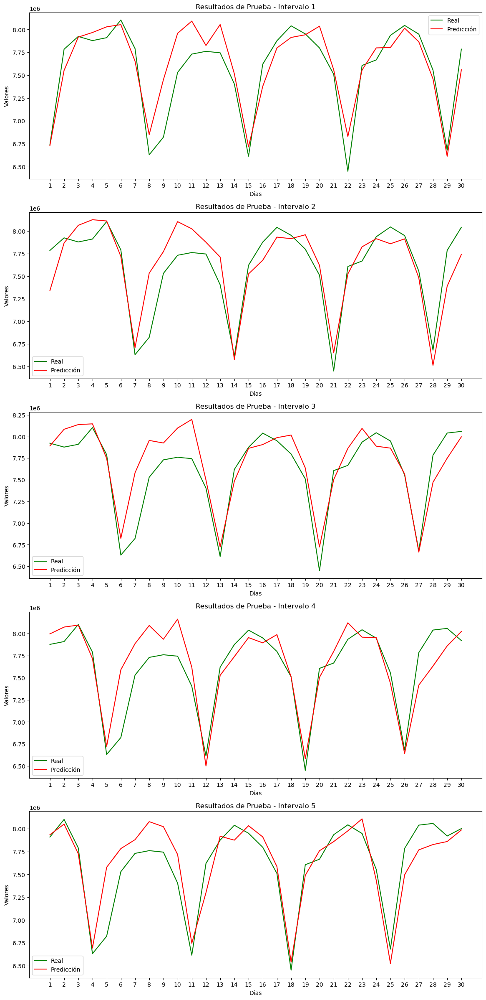

In [92]:
X = matriz_modelo_vcauca.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_vcauca[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_vcauca = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_vcauca['filters_1'], kn_size_1 = best_hyperparameters_CNN_vcauca['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_vcauca['filters_2'], kn_size_2 = best_hyperparameters_CNN_vcauca['kernel_size_2'], dense = best_hyperparameters_CNN_vcauca['units_dense'],
                                learning_rate = best_hyperparameters_CNN_vcauca['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_vcauca.predict(X_train)
testPredict = modelo_CNN_vcauca.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 9

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 399ms/step - loss: 3216271.2500 - val_loss: 2003667.0000
Epoch 2/500
12/12 - 0s - 19ms/step - loss: 1330558.3750 - val_loss: 906580.5625
Epoch 3/500
12/12 - 0s - 20ms/step - loss: 710662.3125 - val_loss: 504301.9375
Epoch 4/500
12/12 - 0s - 20ms/step - loss: 515712.5312 - val_loss: 532213.1250
Epoch 5/500
12/12 - 0s - 19ms/step - loss: 499177.9375 - val_loss: 406370.2500
Epoch 6/500
12/12 - 0s - 19ms/step - loss: 473329.0625 - val_loss: 465423.8125
Epoch 7/500
12/12 - 0s - 20ms/step - loss: 468092.0625 - val_loss: 367855.4688
Epoch 8/500
12/12 - 0s - 19ms/step - loss: 475414.5625 - val_loss: 411798.2500
Epoch 9/500
12/12 - 0s - 20ms/step - loss: 454947.6562 - val_loss: 361201.8438
Epoch 10/500
12/12 - 0s - 18ms/step - loss: 495622.5938 - val_loss: 417557.4375
Epoch 11/500
12/12 - 0s - 18ms/step - loss: 480818.0312 - val_loss: 370939.8750
Epoch 12/500
12/12 - 0s - 16ms/step - loss: 462381.7500 - val_loss: 651606.0000
Epoch 13/500
12/12 - 0s - 15ms/step - loss: 5

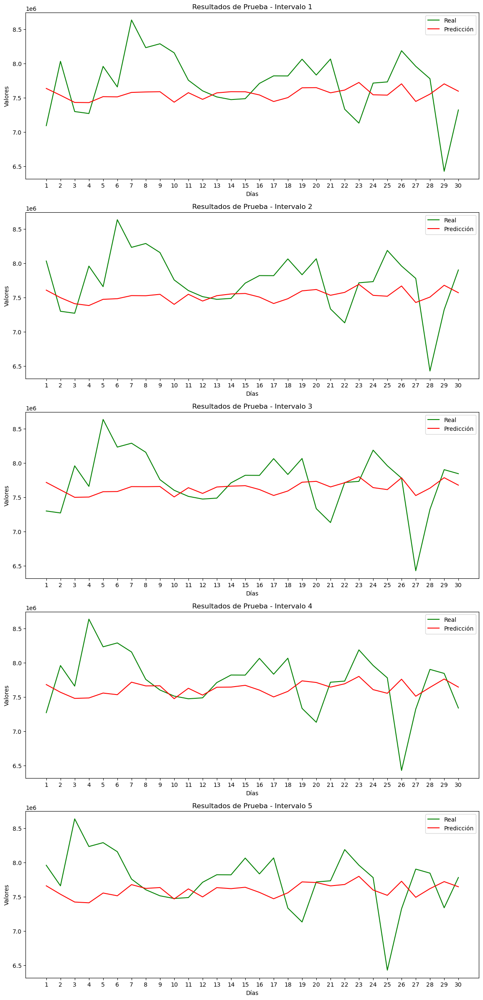

In [93]:
X = matriz_modelo_meta.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_meta[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_meta = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_meta['units_1'], dense_2 = best_hyperparameters_MLP_meta['units_2'], 
                               dense_3 = best_hyperparameters_MLP_meta['units_3'], learning_rate = best_hyperparameters_MLP_meta['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_meta.predict(X_train)
testPredict = modelo_MLP_meta.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 446ms/step - loss: 1910320.3750 - val_loss: 749334.4375
Epoch 2/500
12/12 - 0s - 32ms/step - loss: 723586.5625 - val_loss: 492003.5312
Epoch 3/500
12/12 - 0s - 34ms/step - loss: 539695.5000 - val_loss: 445271.0625
Epoch 4/500
12/12 - 0s - 33ms/step - loss: 515237.0625 - val_loss: 407506.4062
Epoch 5/500
12/12 - 0s - 33ms/step - loss: 493810.4688 - val_loss: 418269.0938
Epoch 6/500
12/12 - 0s - 33ms/step - loss: 488005.2812 - val_loss: 520074.5000
Epoch 7/500
12/12 - 0s - 33ms/step - loss: 519206.2188 - val_loss: 566777.3750
Epoch 8/500
12/12 - 0s - 34ms/step - loss: 623094.1250 - val_loss: 633360.2500
Epoch 9/500
12/12 - 0s - 32ms/step - loss: 562990.0000 - val_loss: 389440.7188
Epoch 10/500
12/12 - 0s - 35ms/step - loss: 568964.3750 - val_loss: 388775.3438
Epoch 11/500
12/12 - 0s - 33ms/step - loss: 513942.5000 - val_loss: 448939.0000
Epoch 12/500
12/12 - 0s - 33ms/step - loss: 473985.9688 - val_loss: 381990.6250
Epoch 13/500
12/12 - 0s - 33ms/step - loss: 472

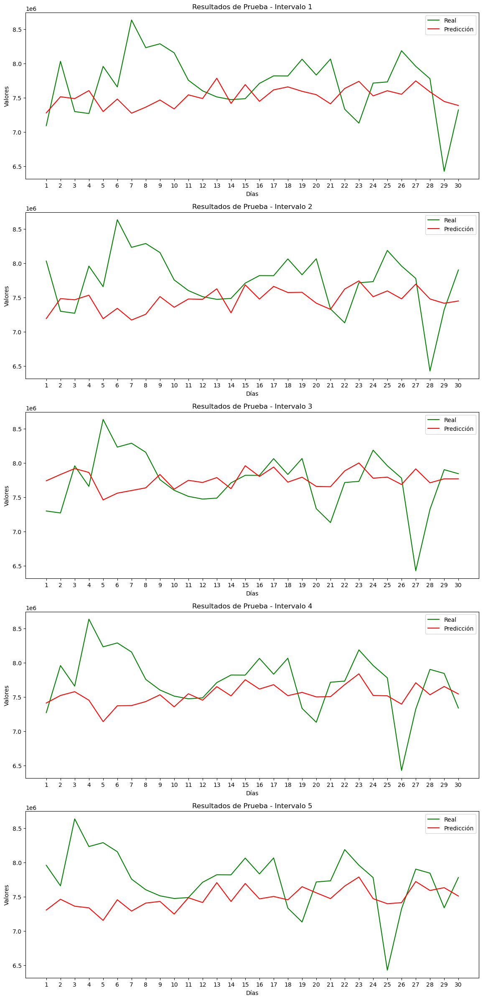

In [94]:
X = matriz_modelo_meta.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_meta[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_meta = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_meta['filters_1'], kn_size_1 = best_hyperparameters_CNN_meta['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_meta['filters_2'], kn_size_2 = best_hyperparameters_CNN_meta['kernel_size_2'], dense = best_hyperparameters_CNN_meta['units_dense'],
                                learning_rate = best_hyperparameters_CNN_meta['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_meta.predict(X_train)
testPredict = modelo_CNN_meta.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

## Ciudad 10

MLP

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 5s - 397ms/step - loss: 2083032.7500 - val_loss: 755639.6250
Epoch 2/500
12/12 - 0s - 19ms/step - loss: 528153.8750 - val_loss: 490701.6875
Epoch 3/500
12/12 - 0s - 19ms/step - loss: 357130.3750 - val_loss: 400995.6562
Epoch 4/500
12/12 - 0s - 20ms/step - loss: 317265.1250 - val_loss: 395056.1250
Epoch 5/500
12/12 - 0s - 19ms/step - loss: 314288.2812 - val_loss: 369378.5000
Epoch 6/500
12/12 - 0s - 19ms/step - loss: 303059.6562 - val_loss: 385283.0312
Epoch 7/500
12/12 - 0s - 18ms/step - loss: 305206.7812 - val_loss: 367592.6562
Epoch 8/500
12/12 - 0s - 18ms/step - loss: 318994.7812 - val_loss: 427142.9688
Epoch 9/500
12/12 - 0s - 18ms/step - loss: 310787.5000 - val_loss: 398502.8750
Epoch 10/500
12/12 - 0s - 19ms/step - loss: 309769.9375 - val_loss: 371299.5312
Epoch 11/500
12/12 - 0s - 19ms/step - loss: 296097.3750 - val_loss: 357588.8438
Epoch 12/500
12/12 - 0s - 18ms/step - loss: 302127.0000 - val_loss: 353184.2812
Epoch 13/500
12/12 - 0s - 18ms/step - loss: 302

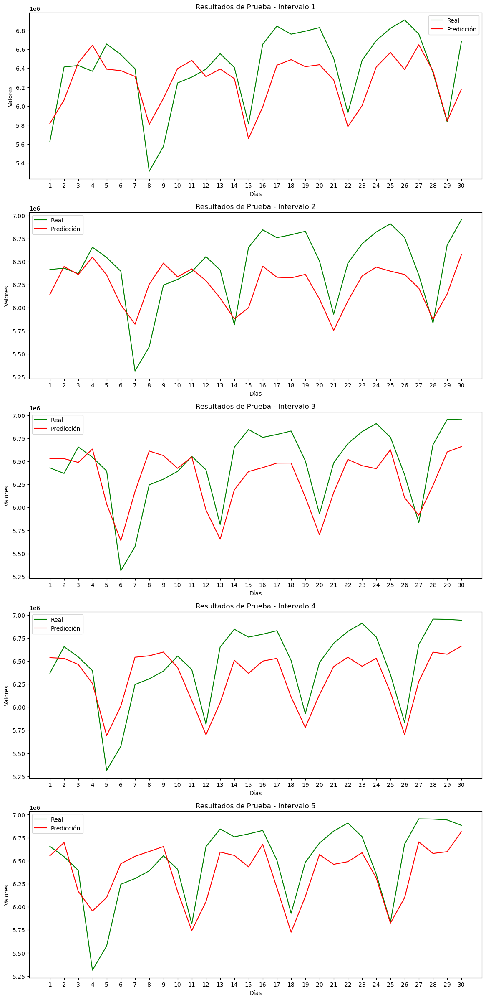

In [95]:
X = matriz_modelo_nsantander.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_nsantander[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_MLP_nsantander = modelo_MLP(X_train, Y_train, dense_1 = best_hyperparameters_MLP_nsantander['units_1'], dense_2 = best_hyperparameters_MLP_nsantander['units_2'], 
                               dense_3 = best_hyperparameters_MLP_nsantander['units_3'], learning_rate = best_hyperparameters_MLP_nsantander['learning_rate'], epochs = 500)

trainPredict = modelo_MLP_nsantander.predict(X_train)
testPredict = modelo_MLP_nsantander.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
12/12 - 6s - 468ms/step - loss: 2885994.2500 - val_loss: 1033734.0625
Epoch 2/500
12/12 - 1s - 50ms/step - loss: 683277.3125 - val_loss: 585460.0000
Epoch 3/500
12/12 - 1s - 49ms/step - loss: 409169.8125 - val_loss: 404388.4375
Epoch 4/500
12/12 - 1s - 48ms/step - loss: 337510.3125 - val_loss: 419496.0938
Epoch 5/500
12/12 - 1s - 50ms/step - loss: 309163.0625 - val_loss: 353662.9375
Epoch 6/500
12/12 - 0s - 39ms/step - loss: 302228.1250 - val_loss: 367994.8125
Epoch 7/500
12/12 - 1s - 46ms/step - loss: 301051.3438 - val_loss: 414227.3438
Epoch 8/500
12/12 - 1s - 50ms/step - loss: 298878.9688 - val_loss: 376368.2812
Epoch 9/500
12/12 - 1s - 49ms/step - loss: 292487.6875 - val_loss: 353103.4688
Epoch 10/500
12/12 - 1s - 49ms/step - loss: 291374.0000 - val_loss: 365996.5312
Epoch 11/500
12/12 - 1s - 48ms/step - loss: 292014.9375 - val_loss: 345794.1562
Epoch 12/500
12/12 - 1s - 50ms/step - loss: 301999.4688 - val_loss: 334665.7188
Epoch 13/500
12/12 - 1s - 49ms/step - loss: 28

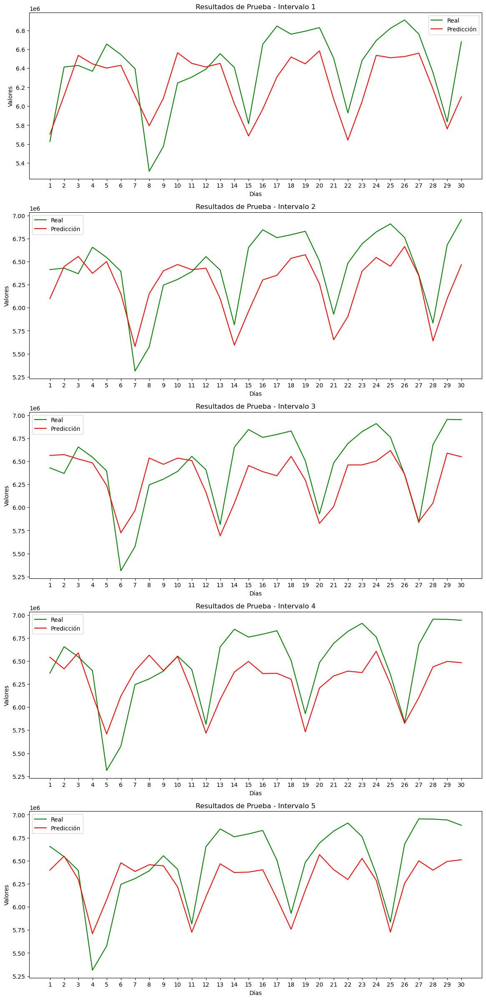

In [96]:
X = matriz_modelo_nsantander.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_nsantander[[f'r-{i+1}' for i in range(30)]]

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]
modelo_CNN_nsantander = modelo_CNN(X_train, Y_train, filter_1 = best_hyperparameters_CNN_nsantander['filters_1'], kn_size_1 = best_hyperparameters_CNN_nsantander['kernel_size_1'], 
                               filter_2 = best_hyperparameters_CNN_nsantander['filters_2'], kn_size_2 = best_hyperparameters_CNN_nsantander['kernel_size_2'], dense = best_hyperparameters_CNN_nsantander['units_dense'],
                                learning_rate = best_hyperparameters_CNN_nsantander['learning_rate'], epochs = 500)

trainPredict = modelo_CNN_nsantander.predict(X_train)
testPredict = modelo_CNN_nsantander.predict(X_test)

# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

# Pruebas A/B

In [97]:
from sklearn.model_selection import train_test_split

def calcular_metricas(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    return {"MSE": mse, "MAE": mae}

def pruebas_ab(control, variant, X, Y):
    xtestA, xtestB, ytestA, ytestB = train_test_split(X, Y, test_size=0.5)
    ypred_control=control.predict(xtestA)
    ypred_variant=variant.predict(xtestB)

    # Métricas para cada modelo
    metrics_control = calcular_metricas(ytestA, ypred_control)
    metrics_variant = calcular_metricas(ytestB, ypred_variant)

    print("Métricas Modelo A:", metrics_control)
    print("Métricas Modelo B:", metrics_variant)

In [99]:
# Ciudad 1
X = matriz_modelo_bogota.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_bogota[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_bogota, modelo_CNN_bogota, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Métricas Modelo A: {'MSE': 5943128275300.457, 'MAE': 1457743.4920307777}
Métricas Modelo B: {'MSE': 5783127800524.672, 'MAE': 1317068.9236859682}


In [100]:
# Ciudad 2
X = matriz_modelo_cm.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cm[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_cm, modelo_CNN_cm, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Métricas Modelo A: {'MSE': 2710216289156.124, 'MAE': 1276701.16609807}
Métricas Modelo B: {'MSE': 2737676592464.378, 'MAE': 1284232.1412420452}


In [101]:
# Ciudad 3
X = matriz_modelo_antioquia.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_antioquia[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_antioquia, modelo_CNN_antioquia, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Métricas Modelo A: {'MSE': 2478117123879.7236, 'MAE': 1107731.560080334}
Métricas Modelo B: {'MSE': 2258478581809.81, 'MAE': 940657.7564564426}


In [102]:
# Ciudad 4
X = matriz_modelo_cs.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cs[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_cs, modelo_CNN_cs, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Métricas Modelo A: {'MSE': 2789932611255.693, 'MAE': 1273456.9877657802}
Métricas Modelo B: {'MSE': 2831368110647.193, 'MAE': 1280668.5747276999}


In [103]:
# Ciudad 5
X = matriz_modelo_cali.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cali[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_cali, modelo_CNN_cali, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Métricas Modelo A: {'MSE': 710881385640.9031, 'MAE': 576025.6573333333}
Métricas Modelo B: {'MSE': 782354116096.675, 'MAE': 617571.492726656}


In [104]:
# Ciudad 6
X = matriz_modelo_santander.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_santander[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_santander, modelo_CNN_santander, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Métricas Modelo A: {'MSE': 224267873704.14795, 'MAE': 348806.73411424103}
Métricas Modelo B: {'MSE': 238884315871.21478, 'MAE': 365369.99037089193}


In [105]:
# Ciudad 7
X = matriz_modelo_boyaca.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_boyaca[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_boyaca, modelo_CNN_boyaca, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Métricas Modelo A: {'MSE': 323038559557.5194, 'MAE': 455858.05002869054}
Métricas Modelo B: {'MSE': 274295727884.09464, 'MAE': 419925.3384512259}


In [106]:
# Ciudad 8
X = matriz_modelo_vcauca.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_vcauca[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_vcauca, modelo_CNN_vcauca, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Métricas Modelo A: {'MSE': 229713779594.1042, 'MAE': 340793.2795659887}
Métricas Modelo B: {'MSE': 205846027708.26138, 'MAE': 325764.08439280116}


In [107]:
# Ciudad 9
X = matriz_modelo_meta.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_meta[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_meta, modelo_CNN_meta, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Métricas Modelo A: {'MSE': 307912777470.84247, 'MAE': 422701.95114136674}
Métricas Modelo B: {'MSE': 283276841272.49347, 'MAE': 399849.9950286907}


In [108]:
# Ciudad 10
X = matriz_modelo_nsantander.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_nsantander[[f'r-{i+1}' for i in range(30)]]
pruebas_ab(modelo_MLP_nsantander, modelo_CNN_nsantander, X, y)

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Métricas Modelo A: {'MSE': 118086938852.05524, 'MAE': 262468.02830672933}
Métricas Modelo B: {'MSE': 115641079867.51607, 'MAE': 259216.29997183106}


# Exportación de los modelos

In [119]:
import joblib

modelo_CNN_bogota.save('modelo_bogota.h5')
modelo_MLP_cm.save('modelo_caribe_mar.h5')
modelo_CNN_antioquia.save('modelo_antioquia.h5')
modelo_MLP_cs.save('modelo_caribe_sol.h5')
modelo_MLP_cali.save('modelo_cali.h5')
modelo_MLP_santander.save('modelo_santander.h5')
modelo_CNN_boyaca.save('modelo_boyaca.h5')
modelo_CNN_vcauca.save('modelo_valle_cauca.h5')
modelo_CNN_meta.save('modelo_meta.h5')
modelo_CNN_nsantander.save('modelo_norte_santander.h5')

# Prueba con normalización

In [122]:
from sklearn.preprocessing import StandardScaler

X = matriz_modelo_cm.drop(columns=[f'r-{i+1}' for i in range(30)])
y = matriz_modelo_cm[[f'r-{i+1}' for i in range(30)]]

# Crear el escalador
scaler = StandardScaler()

# Aplicar la normalización
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
y = pd.DataFrame(scaler.fit_transform(y), columns=y.columns)

# Obtener el primer 70% de los datos
corte = int(0.7 * len(X))

X_train = X.iloc[:corte]
X_test = X.iloc[corte:]

Y_train = y.iloc[:corte]
Y_test = y.iloc[corte:]

# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_mlp, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='MLP_tuning_2_normalized')

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_MLP_cm_nm = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_MLP_cm_nm.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 60 Complete [00h 00m 23s]
val_loss: 1.1022390127182007

Best val_loss So Far: 0.8002392649650574
Total elapsed time: 00h 20m 57s


c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:719: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.08846
Test Loss: 1.0307313203811646


In [123]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_MLP_cm_nm = best_trial.hyperparameters.values
print(best_hyperparameters_MLP_cm_nm)

{'units_1': 64, 'units_2': 384, 'units_3': 64, 'learning_rate': 5.9643556562362086e-05, 'tuner/epochs': 3, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


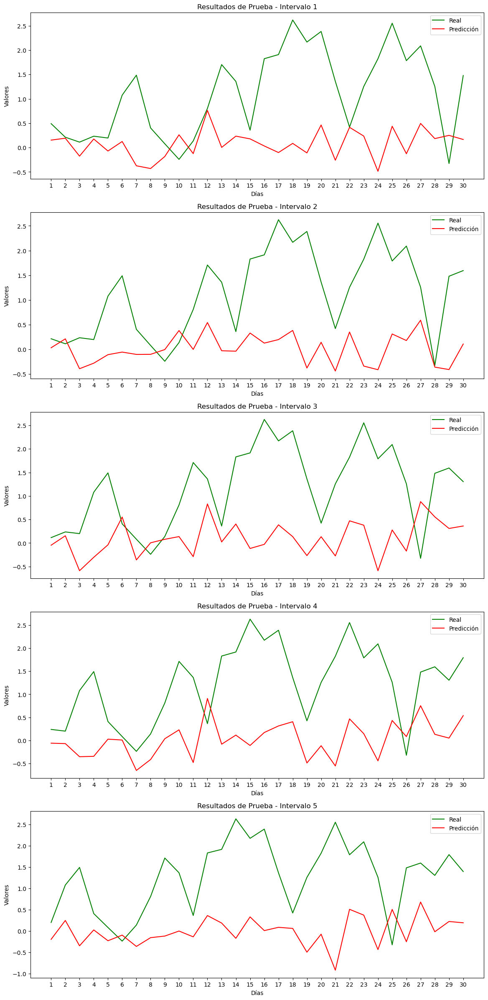

In [124]:
trainPredict = best_model_MLP_cm_nm.predict(X_train)
testPredict = best_model_MLP_cm_nm.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)

CNN

In [125]:
# Crear el objeto de búsqueda de hiperparámetros
tuner = kt.Hyperband(build_model_CNN, 
                     objective='val_loss', 
                     max_epochs=20, 
                     hyperband_iterations=2, 
                     directory='my_dir', 
                     project_name='CNN_tuning_2_nm')

# Parada temprana para evitar sobreajuste
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Ejecutar la búsqueda de hiperparámetros
tuner.search(X_train, Y_train, 
             validation_split=0.2, 
             epochs=50, 
             batch_size=64, 
             callbacks=[early_stopping])

# Obtener el mejor modelo
best_model_CNN_cm_nm = tuner.get_best_models(num_models=1)[0]

# Evaluar el modelo con los datos de prueba
loss = best_model_CNN_cm_nm.evaluate(X_test, Y_test)
print("Test Loss:", loss)

Trial 3 Complete [00h 00m 24s]
val_loss: 1.1034339666366577

Best val_loss So Far: 0.9276151061058044
Total elapsed time: 00h 01m 09s

Search: Running Trial #4

Value             |Best Value So Far |Hyperparameter
32                |32                |filters_1
5                 |3                 |kernel_size_1
192               |64                |filters_2
7                 |3                 |kernel_size_2
192               |128               |units_dense
0.00020922        |5.025e-05         |learning_rate
3                 |3                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
2                 |2                 |tuner/bracket
0                 |0                 |tuner/round



c:\Users\Nicolas Estepa\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/3
 5/12 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.6101

KeyboardInterrupt: 

In [ ]:
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
best_hyperparameters_CNN_cm_nm = best_trial.hyperparameters.values
print(best_hyperparameters_CNN_cm_nm)

In [ ]:
trainPredict = best_model_CNN_cm_nm.predict(X_train)
testPredict = best_model_CNN_cm_nm.predict(X_test)
# Graficamos los primeros 10 intervalos de prueba
plot_by_interval(Y_test, testPredict, 'Resultados de Prueba', 'green', 'red', max_plots=5)